#**MIT 807**: Mini-dissertation, Department of Computer Science, University of Pretoria

**Title**: Identifying financial risk through Natural Language Processing of company annual reports

**Student**: Lamont Theron, u19333634@tuks.co.za


---
Last updated: 2020-11-05

Note: Exploratory Data Analysis (incl. Chi-Square)

Requirements

1.   Colab
2.   header.csv in GitHub\data\processed folder
3.   pageText.csv in GitHub\data\processed folder

To do


1.   Analyse other SA reports especially ABSA
2.   Compare VBS with JPMorgan (Risk vs no risk in SA)
3.   Get reports with ToC
4.   Include readability
5.   Most negative report, most uncertain, most strategic etc.
6.   Topic analysis
7.   Add endPage and pageRatio to header.csv
8.   Remove numbers
9.   Fix headNo=1

In [ ]:
from google.colab import drive

In [ ]:
#Mount Google Drive to get paths
drive.mount('/content/drive')

Mounted at /content/drive


#1 Variables

In [ ]:
#Define paths
pathData='./drive/My Drive/MIT 807 Big Data Science Mini-Dissertation/GitHub/data/'

In [ ]:
featureMax=20

In [ ]:
# Word2vec properties
embedding_size = 300
window_size = 5 #Maximum distance between the current and predicted word within a sentence
min_count_words = 5
threads=2

#2 Install and Import Packages

##2.1 Wrap text in output
from IPython.display import HTML, display

def set_css():
  display(HTML('''
  <style>
    pre {
       white-space: pre-wrap;
    }
  </style>
  '''))
get_ipython().events.register('pre_run_cell', set_css)

In [ ]:
 #50 (default)
 
 pd.options.display.max_colwidth

50

##2.2. Rest

In [ ]:
#for dataframe
import pandas as pd

In [ ]:
#pd.set_option('display.max_colwidth',None)
#pd.set_option('display.max_colwidth',20)
#pd.set_option('display.max_colwidth',60)
#pd.set_option('display.max_colwidth',1000)

In [ ]:
#for plotting ligusitic and topic analysis
import matplotlib.pyplot as plt

In [ ]:
#for linguistic analysis
import numpy as np

In [ ]:
#for punctuation removal
import string

In [ ]:
#for word tokenizer
import nltk

In [ ]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [ ]:
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.


True

In [ ]:
#for stopword removal in custom tokenizer
from nltk.corpus import stopwords

In [ ]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
#Lemmatize text for Topic Analysis
from nltk.stem import WordNetLemmatizer

In [ ]:
#for Topic Analysis
from sklearn.feature_extraction.text import TfidfVectorizer

In [ ]:
#for Latent Dirichlet Allocation (LDA)
from sklearn.decomposition import LatentDirichletAllocation as LDA

In [ ]:
#for topic analysis
from wordcloud import WordCloud

In [ ]:
#for py-readability-metrics
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [ ]:
#Score the readability of text using py-readability-metrics
!pip install py-readability-metrics               

In [ ]:
#Import from py-readability-metrics
from readability import Readability

In [ ]:
#Score the readability of text using textstat
!pip install textstat

     |████████████████████████████████| 102kB 1.9MB/s 
     |████████████████████████████████| 1.9MB 8.4MB/s 


In [ ]:
#Import textstat 
import textstat as ts

In [ ]:
#Used to read saved tokens
import csv

In [ ]:
#Principal Component Analysis (PCA)
from sklearn.decomposition import PCA

In [ ]:
#For rainbow colours
from matplotlib.pyplot import cm

In [ ]:
#Truncated Singular Value Decomposition (SVD)
from sklearn.decomposition import TruncatedSVD

In [ ]:
#t-distributed Stochastic Neighbour Embedding (t-SNE)
from sklearn.manifold import TSNE

In [ ]:
# Word Representations in Vector Space (word embedding)
from gensim.models import Word2Vec

In [ ]:
#RegexpTokenizer
from nltk.tokenize import RegexpTokenizer

#3 Read Data


1.   Read Header to identify pages
2.   Read Page Text
3.   Print header text for VBS
4.   Aggregate pages into documents

##3.1 Read Header to identify pages

In [ ]:
#Check for peviously processed headers to append at the end else create empty dataframe
headColumns=['docID','docName','year','pages','headID','headNo','headLevel','headText','headClass','headItem','actualPage','pdfPage','done']

try:
    header_df=pd.read_csv(pathData+'interim/header.csv', index_col=[0], lineterminator='\n')

except FileNotFoundError:
    header_df=pd.DataFrame(columns=headColumns)

In [ ]:
header_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5828 entries, 0 to 5827
Data columns (total 14 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   docID       5828 non-null   int64  
 1   docName     5828 non-null   object 
 2   year        5828 non-null   int64  
 3   pages       5828 non-null   int64  
 4   headID      5828 non-null   int64  
 5   headNo      5828 non-null   int64  
 6   headLevel   5828 non-null   int64  
 7   headText    5769 non-null   object 
 8   headClass   161 non-null    object 
 9   headItem    161 non-null    object 
 10  score       2156 non-null   float64
 11  actualPage  5828 non-null   float64
 12  pdfPage     5828 non-null   int64  
 13  done        5828 non-null   int64  
dtypes: float64(2), int64(8), object(4)
memory usage: 683.0+ KB


##3.2 Read Page Text

In [ ]:
#Read peviously processed page text
pageTextColumns=['docID','docName','year', 'coID', 'coName','risk','pageRatio','pages','oldPdfPage','pdfPage','text',
                 'wordCount', 'forward1', 'forward2', 'LMneg', 'LMpos', 'H6neg','H6pos', 'H8neg', 'H8pos',
                 'uncert', 'causal', 'causalM', 'causalM50','perf', 'strat']
try:
    pageText_df=pd.read_csv(pathData+'processed/pageText.csv', index_col=[0])
except FileNotFoundError:
    print('File pageText.csv is missing from ../data/processed/ folder')

In [ ]:
#Check read
pageText_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 60825 entries, 0 to 60824
Data columns (total 26 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   docID       60825 non-null  int64 
 1   docName     60825 non-null  object
 2   year        60825 non-null  int64 
 3   coID        60825 non-null  int64 
 4   coName      60825 non-null  object
 5   risk        60825 non-null  int64 
 6   pageRatio   60825 non-null  int64 
 7   pages       60825 non-null  int64 
 8   oldPdfPage  60825 non-null  int64 
 9   pdfPage     60825 non-null  int64 
 10  text        60212 non-null  object
 11  wordCount   60825 non-null  int64 
 12  forward1    60825 non-null  int64 
 13  forward2    60825 non-null  int64 
 14  LMneg       60825 non-null  int64 
 15  LMpos       60825 non-null  int64 
 16  H6neg       60825 non-null  int64 
 17  H6pos       60825 non-null  int64 
 18  H8neg       60825 non-null  int64 
 19  H8pos       60825 non-null  int64 
 20  uncert

##3.3 Print header text for VBS

###3.3.1 Annual report for 2015

In [ ]:
#Get VBS 2015 headers
header_df[header_df['docName']=='VBS-2015-Annual-Report.pdf']

,docID,docName,year,pages,headID,headNo,headLevel,headText,headClass,headItem,score,actualPage,pdfPage,done,headPage,endPage
5800,357,VBS-2015-Annual-Report.pdf,2015,56,25974,1,1,Introduction to VBS,NaN,NaN,-1.0,1.0,5,0,NaN,NaN
5801,357,VBS-2015-Annual-Report.pdf,2015,56,25975,1,1,Governance,NaN,NaN,-1.0,3.0,7,0,NaN,NaN
5802,357,VBS-2015-Annual-Report.pdf,2015,56,25976,1,1,Chairman's report,NaN,NaN,-1.0,9.0,13,0,NaN,NaN
5803,357,VBS-2015-Annual-Report.pdf,2015,56,25977,1,1,Audit and Risk Committee report,NaN,NaN,-1.0,12.0,16,0,NaN,NaN
5804,357,VBS-2015-Annual-Report.pdf,2015,56,25978,1,1,Chief Executive report,CEO review,chiefexecutivesreport,84.0,16.0,20,0,NaN,NaN
5805,357,VBS-2015-Annual-Report.pdf,2015,56,25979,1,1,Performance Overview,NaN,NaN,-1.0,18.0,22,0,NaN,NaN
5806,357,VBS-2015-Annual-Report.pdf,2015,56,25980,1,1,Directors' responsibility statement,NaN,NaN,-1.0,19.0,23,0,NaN,NaN
5807,357,VBS-2015-Annual-Report.pdf,2015,56,25981,1,1,Directors' report,NaN,NaN,-1.0,20.0,24,0,NaN,NaN
5808,357,VBS-2015-Annual-Report.pdf,2015,56,25982,1,1,Independent auditor's report,Auditors report,independentauditorsreport,91.0,21.0,25,0,NaN,NaN
5809,357,VBS-2015-Annual-Report.pdf,2015,56,25983,1,1,Statement of financial position,NaN,NaN,-1.0,22.0,26,0,NaN,NaN


In [ ]:
#Get VBS 2016 header text for introduction to VBs

#Why is pageText_df.pdfPage = header_df.actualPage?

pd.set_option('display.max_colwidth',None)
pageText_df[(pageText_df['docName']=='VBS-2015-Annual-Report.pdf')&(pageText_df['pdfPage']==5)]['text']

60682     The Bank is a member of the following organisations: ������� The Banking Association of South Africa (BASA) ������� ������� The Payments Association of South Africa (PASA). ������� BankServ Africa ������� VISA International (associate member) Shareholding profile The bank's largest shareholders are the Public Investment Corporation (25.26%) and Dyambeu Investments (Pty) Ltd (25.22%). Broad Based Black Economic Empowerment Below is a graphical profile of the bank as at 31 March 2015: VBS Mutual Bank is a bona fide BBBEE organisation. The bank is a level 1 contributor with a recognition level of 135% in terms of BBBEE. As at 31 March 2015 black shareholding comprised 99.57% of total shareholding The only share product issued by the bank which qualifies as primary capital is permanent interest bearing shares. The initial subscription of\nR25 million was approved by shareholders of the bank. This subscription has been fully subscribed. The Bank was established in1982 and initiall

####3.3.1.1 Set header page numbers for VBS

In [ ]:
#Set VBS 2015 header pages
header_df.loc[header_df['docName']=='VBS-2015-Annual-Report.pdf','headPage']=header_df[header_df['docName']=='VBS-2015-Annual-Report.pdf']['pdfPage']

####3.3.1.2 Set endPage for each section

In [ ]:
docID=357

In [ ]:
endPage=55

In [ ]:
#Create endPage column
header_df.loc[(header_df['docID']==docID),'endPage']=-1

In [ ]:
#Get last header for VBS 2016
headMax=header_df.loc[(header_df['docID']==docID)].index.max()

In [ ]:
#Get first header for VBS 2016
headMin=header_df.loc[(header_df['docID']==docID)].index.min()

In [ ]:
#Set end pages for each section
headEnd=endPage

for index in range(headMax,headMin-1,-1):
  headPage=header_df.loc[index,'headPage']
  if headPage<=headEnd:
    #print(index,headPage,headEnd)
    header_df.loc[index,'endPage']=headEnd
    headEnd=headPage-1

In [ ]:
#Check endPage
header_df[(header_df['docID']==docID)]

,docID,docName,year,pages,headID,headNo,headLevel,headText,headClass,headItem,score,actualPage,pdfPage,done,headPage,endPage
5800,357,VBS-2015-Annual-Report.pdf,2015,56,25974,1,1,Introduction to VBS,NaN,NaN,-1.0,1.0,5,0,5.0,6.0
5801,357,VBS-2015-Annual-Report.pdf,2015,56,25975,1,1,Governance,NaN,NaN,-1.0,3.0,7,0,7.0,12.0
5802,357,VBS-2015-Annual-Report.pdf,2015,56,25976,1,1,Chairman's report,NaN,NaN,-1.0,9.0,13,0,13.0,15.0
5803,357,VBS-2015-Annual-Report.pdf,2015,56,25977,1,1,Audit and Risk Committee report,NaN,NaN,-1.0,12.0,16,0,16.0,19.0
5804,357,VBS-2015-Annual-Report.pdf,2015,56,25978,1,1,Chief Executive report,CEO review,chiefexecutivesreport,84.0,16.0,20,0,20.0,21.0
5805,357,VBS-2015-Annual-Report.pdf,2015,56,25979,1,1,Performance Overview,NaN,NaN,-1.0,18.0,22,0,22.0,22.0
5806,357,VBS-2015-Annual-Report.pdf,2015,56,25980,1,1,Directors' responsibility statement,NaN,NaN,-1.0,19.0,23,0,23.0,23.0
5807,357,VBS-2015-Annual-Report.pdf,2015,56,25981,1,1,Directors' report,NaN,NaN,-1.0,20.0,24,0,24.0,24.0
5808,357,VBS-2015-Annual-Report.pdf,2015,56,25982,1,1,Independent auditor's report,Auditors report,independentauditorsreport,91.0,21.0,25,0,25.0,25.0
5809,357,VBS-2015-Annual-Report.pdf,2015,56,25983,1,1,Statement of financial position,NaN,NaN,-1.0,22.0,26,0,26.0,26.0


###3.3.2 Annual report for 2016

In [ ]:
#Get VBS 2016 headers
header_df[header_df['docName']=='VBS-2016-Annual-Report.pdf']

5814                       introduction to VBs 
5815                                 Governance
5816                          chairman's report
5817            Audit and risk committee report
5818           chief executive officer’s review
5819                       Performance overview
5820        Directors' responsibility statement
5821                          Directors' report
5822               Independent auditor's report
5823            Statement of financial position
5824          Statement of comprehensive income
5825                    Statement of cash flows
5826    Statement of changes in shareholders...
5827    Notes to the annual financial statem...
Name: headText, dtype: object

In [ ]:
#Get VBS 2016 header text for introduction to VBs

#Why is pageText_df.pdfPage = header_df.actualPage?
#maybe due to pageRatio = 2

pageText_df[(pageText_df['docName']=='VBS-2016-Annual-Report.pdf')&(pageText_df['pdfPage']==13)]['text']

60746     1 4 1 5 V B S  M u t ua l  B a n k ...
Name: text, dtype: object

In [ ]:
#Get VBS 2016 header text for Audit and risk committee report

#Why is pageText_df.pdfPage = betweeb header_df.pdfPage and header_df.actualPage?
#Where is the endPage?

pageText_df[(pageText_df['docName']=='VBS-2016-Annual-Report.pdf')&(pageText_df['pdfPage']==35)]['text'].values

array([' 3 6 3 7 V B S  M u t ua l  B a n k  |  a n n ua l  R e p o R t  |  2 0 1 6 p e o p l e  W i t h  a  p u R p o S e A u d i t  A n d  r i s k  c o M M i t t e e  r e P o r t W\ne are pleased to present our report of the Audit and \nRisk Committee “the committee” of VBS Mutual \nBank appointed for the financial year ended 31 March \n2016 in compliance with the Companies Act and in terms \nof the Mutual Banks Act.  Audit committee charter and terms of reference  The VBS Mutual Bank Audit and Risk ommittee “the \ncommittee” has adopted a formal charter and terms of \nreference that has been approved by the board of directors. \nThe committee has conducted its affairs in compliance \nwith this mandate and the terms of reference and has \ndischarged its responsibilities contained therein. The \ncommittee has a charter that complies with the Mutual \nBanks Act and King III requirements. Copies are available \nfrom the bank secretary on request. composition and membership  The sharehol

In [ ]:
#Get VBS 2016 header text for consecutive pages

#Why is pageText_df.pdfPage = betweeb header_df.pdfPage and header_df.actualPage?

print(pageText_df[(pageText_df['docName']=='VBS-2016-Annual-Report.pdf')&(pageText_df['pdfPage']==55)]['text'].values)
print(pageText_df[(pageText_df['docName']=='VBS-2016-Annual-Report.pdf')&(pageText_df['pdfPage']==56)]['text'].values)
print(pageText_df[(pageText_df['docName']=='VBS-2016-Annual-Report.pdf')&(pageText_df['pdfPage']==57)]['text'].values)

[' 5 6 5 7 V B S  M u t ua l  B a n k  |  a n n ua l  R e p o R t  |  2 0 1 6 p e o p l e  W i t h  a  p u R p o S e s tAt e M e n t  o F  c A s h  F l o W s -  F o r  t h e  y e A r  e n d e d  3 1  M A r c h  2 0 1 6  - 2016 2015\nnotes r r cash flows from operating activities Cash received from customers 18.1\n 67 788 565 \n 36 757 430  Cash paid to customers, suppliers and employees 18.2\n (59 732 718)\n (34 763 048) Decrease in income earning assets 18.3\n (497 939 127)\n (17 688 895) Increase in deposits and other liabilities 18.4\n 270 670 847 \n 68 088 344  cash flows (utilised by)/generated from operating activities before \ntaxation\n (219 212 433)\n 52 393 831  taxation paid\n18.6\n - \n -  cash flows (utilised by)/ generated from operating activities\n (219 212 433)\n 52 393 831     \n  cash flows from investing activities Capital expenditure on equipment 7\n (16 468 267)\n (1 309 375) Capital expenditure on intangible assets 8\n (2 453 513)\n (623 294) Proceeds from sale o

In [ ]:
#Check last page
docID=358
endPage=int(46*2-1)
print(pageText_df[(pageText_df['docID']==docID)&(pageText_df['pdfPage']==endPage)]['text'])

60824     V B s  M u t uA l  B A n k  |  A n ...
Name: text, dtype: object


####3.3.2.1 Fix header page numbers for VBS

In [ ]:
#Get VBS 2016 headers
header_df[header_df['docName']=='VBS-2016-Annual-Report.pdf']

,docID,docName,year,pages,headID,headNo,headLevel,headText,headClass,headItem,score,actualPage,pdfPage,done,headPage
5814,358,VBS-2016-Annual-Report.pdf,2016,47,25988,1,1,introduction to VBs,NaN,NaN,-1.0,14.0,12,0,13.0
5815,358,VBS-2016-Annual-Report.pdf,2016,47,25989,2,1,Governance,NaN,NaN,-1.0,25.0,23,0,24.0
5816,358,VBS-2016-Annual-Report.pdf,2016,47,25990,3,1,chairman's report,NaN,NaN,-1.0,34.0,32,0,33.0
5817,358,VBS-2016-Annual-Report.pdf,2016,47,25991,4,1,Audit and risk committee report,NaN,NaN,-1.0,36.0,34,0,35.0
5818,358,VBS-2016-Annual-Report.pdf,2016,47,25992,5,1,chief executive officer’s review,CEO review,chiefexecutiveofficerreview,92.0,42.0,40,0,41.0
5819,358,VBS-2016-Annual-Report.pdf,2016,47,25993,6,1,Performance overview,NaN,NaN,-1.0,44.0,42,0,43.0
5820,358,VBS-2016-Annual-Report.pdf,2016,47,25994,8,1,Directors' responsibility statement,NaN,NaN,-1.0,48.0,46,0,47.0
5821,358,VBS-2016-Annual-Report.pdf,2016,47,25995,9,1,Directors' report,NaN,NaN,-1.0,50.0,48,0,49.0
5822,358,VBS-2016-Annual-Report.pdf,2016,47,25996,10,1,Independent auditor's report,Auditors report,independentauditorsreport,91.0,52.0,50,0,51.0
5823,358,VBS-2016-Annual-Report.pdf,2016,47,25997,11,1,Statement of financial position,NaN,NaN,-1.0,54.0,52,0,53.0


In [ ]:
#Other documents should have NaN
header_df

,docID,docName,year,pages,headID,headNo,headLevel,headText,headClass,headItem,score,actualPage,pdfPage,done,headPage
0,48,BANK OF CHINA LTD JHB BRANCH 2015 An...,2015,320,231,1,1,Cover\r,NaN,NaN,-1.0,1.0,0,0,NaN
1,48,BANK OF CHINA LTD JHB BRANCH 2015 An...,2015,320,232,2,1,Inside Cover,NaN,NaN,-1.0,2.0,1,0,NaN
2,48,BANK OF CHINA LTD JHB BRANCH 2015 An...,2015,320,233,3,1,Introduction,NaN,NaN,-1.0,4.0,3,0,NaN
3,48,BANK OF CHINA LTD JHB BRANCH 2015 An...,2015,320,234,4,1,Development Strategy,NaN,NaN,-1.0,5.0,4,0,NaN
4,48,BANK OF CHINA LTD JHB BRANCH 2015 An...,2015,320,235,5,1,Contents,NaN,NaN,-1.0,6.0,5,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5823,358,VBS-2016-Annual-Report.pdf,2016,47,25997,11,1,Statement of financial position,NaN,NaN,-1.0,54.0,52,0,53.0
5824,358,VBS-2016-Annual-Report.pdf,2016,47,25998,12,1,Statement of comprehensive income,NaN,NaN,-1.0,55.0,53,0,54.0
5825,358,VBS-2016-Annual-Report.pdf,2016,47,25999,13,1,Statement of cash flows,NaN,NaN,-1.0,56.0,54,0,55.0
5826,358,VBS-2016-Annual-Report.pdf,2016,47,26000,14,1,Statement of changes in shareholders...,NaN,NaN,-1.0,57.0,55,0,56.0


In [ ]:
#Set VBS 2016 header pages
header_df.loc[header_df['docName']=='VBS-2016-Annual-Report.pdf','headPage']=header_df[header_df['docName']=='VBS-2016-Annual-Report.pdf']['pdfPage']+1

In [ ]:
#Get VBS 2016 headers
header_df[header_df['docName']=='VBS-2016-Annual-Report.pdf']

,docID,docName,year,pages,headID,headNo,headLevel,headText,headClass,headItem,score,actualPage,pdfPage,done,headPage
5814,358,VBS-2016-Annual-Report.pdf,2016,47,25988,1,1,introduction to VBs,NaN,NaN,-1.0,14.0,12,0,13.0
5815,358,VBS-2016-Annual-Report.pdf,2016,47,25989,2,1,Governance,NaN,NaN,-1.0,25.0,23,0,24.0
5816,358,VBS-2016-Annual-Report.pdf,2016,47,25990,3,1,chairman's report,NaN,NaN,-1.0,34.0,32,0,33.0
5817,358,VBS-2016-Annual-Report.pdf,2016,47,25991,4,1,Audit and risk committee report,NaN,NaN,-1.0,36.0,34,0,35.0
5818,358,VBS-2016-Annual-Report.pdf,2016,47,25992,5,1,chief executive officer’s review,CEO review,chiefexecutiveofficerreview,92.0,42.0,40,0,41.0
5819,358,VBS-2016-Annual-Report.pdf,2016,47,25993,6,1,Performance overview,NaN,NaN,-1.0,44.0,42,0,43.0
5820,358,VBS-2016-Annual-Report.pdf,2016,47,25994,8,1,Directors' responsibility statement,NaN,NaN,-1.0,48.0,46,0,47.0
5821,358,VBS-2016-Annual-Report.pdf,2016,47,25995,9,1,Directors' report,NaN,NaN,-1.0,50.0,48,0,49.0
5822,358,VBS-2016-Annual-Report.pdf,2016,47,25996,10,1,Independent auditor's report,Auditors report,independentauditorsreport,91.0,52.0,50,0,51.0
5823,358,VBS-2016-Annual-Report.pdf,2016,47,25997,11,1,Statement of financial position,NaN,NaN,-1.0,54.0,52,0,53.0


In [ ]:
#Other documents should have NaN
header_df

,docID,docName,year,pages,headID,headNo,headLevel,headText,headClass,headItem,score,actualPage,pdfPage,done,headPage
0,48,BANK OF CHINA LTD JHB BRANCH 2015 An...,2015,320,231,1,1,Cover\r,NaN,NaN,-1.0,1.0,0,0,NaN
1,48,BANK OF CHINA LTD JHB BRANCH 2015 An...,2015,320,232,2,1,Inside Cover,NaN,NaN,-1.0,2.0,1,0,NaN
2,48,BANK OF CHINA LTD JHB BRANCH 2015 An...,2015,320,233,3,1,Introduction,NaN,NaN,-1.0,4.0,3,0,NaN
3,48,BANK OF CHINA LTD JHB BRANCH 2015 An...,2015,320,234,4,1,Development Strategy,NaN,NaN,-1.0,5.0,4,0,NaN
4,48,BANK OF CHINA LTD JHB BRANCH 2015 An...,2015,320,235,5,1,Contents,NaN,NaN,-1.0,6.0,5,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5823,358,VBS-2016-Annual-Report.pdf,2016,47,25997,11,1,Statement of financial position,NaN,NaN,-1.0,54.0,52,0,53.0
5824,358,VBS-2016-Annual-Report.pdf,2016,47,25998,12,1,Statement of comprehensive income,NaN,NaN,-1.0,55.0,53,0,54.0
5825,358,VBS-2016-Annual-Report.pdf,2016,47,25999,13,1,Statement of cash flows,NaN,NaN,-1.0,56.0,54,0,55.0
5826,358,VBS-2016-Annual-Report.pdf,2016,47,26000,14,1,Statement of changes in shareholders...,NaN,NaN,-1.0,57.0,55,0,56.0


####3.3.2.2 Set endPage for each section

In [ ]:
#Create endPage column
header_df.loc[(header_df['docID']==docID),'endPage']=-1

In [ ]:
#Get last header for VBS 2016
headMax=header_df.loc[(header_df['docID']==docID)].index.max()

In [ ]:
#Get first header for VBS 2016
headMin=header_df.loc[(header_df['docID']==docID)].index.min()

In [ ]:
#Set end pages for each section
headEnd=endPage

for index in range(headMax,headMin-1,-1):
  headPage=header_df.loc[index,'headPage']
  if headPage<=headEnd:
    #print(index,headPage,headEnd)
    header_df.loc[index,'endPage']=headEnd
    headEnd=headPage-1

In [ ]:
#Check endPage
header_df[(header_df['docID']==docID)]

,docID,docName,year,pages,headID,headNo,headLevel,headText,headClass,headItem,score,actualPage,pdfPage,done,headPage,endPage
5814,358,VBS-2016-Annual-Report.pdf,2016,47,25988,1,1,introduction to VBs,NaN,NaN,-1.0,14.0,12,0,13.0,23.0
5815,358,VBS-2016-Annual-Report.pdf,2016,47,25989,2,1,Governance,NaN,NaN,-1.0,25.0,23,0,24.0,32.0
5816,358,VBS-2016-Annual-Report.pdf,2016,47,25990,3,1,chairman's report,NaN,NaN,-1.0,34.0,32,0,33.0,34.0
5817,358,VBS-2016-Annual-Report.pdf,2016,47,25991,4,1,Audit and risk committee report,NaN,NaN,-1.0,36.0,34,0,35.0,40.0
5818,358,VBS-2016-Annual-Report.pdf,2016,47,25992,5,1,chief executive officer’s review,CEO review,chiefexecutiveofficerreview,92.0,42.0,40,0,41.0,42.0
5819,358,VBS-2016-Annual-Report.pdf,2016,47,25993,6,1,Performance overview,NaN,NaN,-1.0,44.0,42,0,43.0,46.0
5820,358,VBS-2016-Annual-Report.pdf,2016,47,25994,8,1,Directors' responsibility statement,NaN,NaN,-1.0,48.0,46,0,47.0,48.0
5821,358,VBS-2016-Annual-Report.pdf,2016,47,25995,9,1,Directors' report,NaN,NaN,-1.0,50.0,48,0,49.0,50.0
5822,358,VBS-2016-Annual-Report.pdf,2016,47,25996,10,1,Independent auditor's report,Auditors report,independentauditorsreport,91.0,52.0,50,0,51.0,52.0
5823,358,VBS-2016-Annual-Report.pdf,2016,47,25997,11,1,Statement of financial position,NaN,NaN,-1.0,54.0,52,0,53.0,53.0


##3.4 Aggregate pages into documents

In [ ]:
#Group pages into documents
aggFunc={'text':' '.join}

#FillNA to avoid TypeError: sequence item 0: expected str instance, float found
docText_df=pageText_df.fillna('').groupby(['coID','coName','docID','docName','year','risk'], as_index=False).agg(aggFunc)

In [ ]:
docText_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 265 entries, 0 to 264
Data columns (total 7 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   coID     265 non-null    int64 
 1   coName   265 non-null    object
 2   docID    265 non-null    int64 
 3   docName  265 non-null    object
 4   year     265 non-null    int64 
 5   risk     265 non-null    int64 
 6   text     265 non-null    object
dtypes: int64(4), object(3)
memory usage: 16.6+ KB


In [ ]:
docText_df.head()

,coID,coName,docID,docName,year,risk,text
0,1,VBS Mutual Bank,357,VBS-2015-Annual-Report.pdf,2015,1,People with a purpose. “People with a Purp...
1,1,VBS Mutual Bank,358,VBS-2016-Annual-Report.pdf,2016,1,A n n u A l \nR e p o R t\n2 0 1 6 People w...
2,2,Absa Group,0,2009-ABSA Group annual-report.pdf,2009,0,Absa Group Limited. Authorised financial serv...
3,2,Absa Group,1,2010- ABSA Group annual-report.pdf,2010,0,Absa Group Limited Annual report ������������...
4,3,Absa Bank Ltd,2,2009-12-31-Absa-Bank-Annual-Report.pdf,2009,0,Absa Bank Limited. Authorised financial servi...


##3.5 Read tokens

Fix save of t_train and t_test!

In [ ]:
r_code='20'

In [ ]:
#Tokenize and remove stop words from testing data
try:
    with open(pathData+'interim/'+r_code+'_t_train.csv', newline='', encoding='utf-8') as file:
        reader = csv.reader(file)
        t_train = list(reader)
except:
    print(pathData+'interim/'+r_code+'_t_train.csv is missing')

In [ ]:
t_train[0]

['annual',
 'review',
 'leveraging',
 'strengths',
 'rising',
 'challenges',
 'earning',
 'trust',
 'deutsche',
 'bank',
 'group',
 'glance',
 'share',
 'price',
 'period',
 'end',
 'share',
 'price',
 'high',
 'share',
 'price',
 'low',
 'basic',
 'earnings',
 'per',
 'share',
 'diluted',
 'earnings',
 'per',
 'share',
 'average',
 'shares',
 'outstanding',
 'basic',
 'average',
 'shares',
 'outstanding',
 'diluted',
 'pre',
 'tax',
 'return',
 'average',
 'shareholders',
 'equity',
 'pre',
 'tax',
 'return',
 'average',
 'active',
 'equity',
 'post',
 'tax',
 'return',
 'average',
 'shareholders',
 'equity',
 'post',
 'tax',
 'return',
 'average',
 'active',
 'equity',
 'cost',
 'income',
 'ratio',
 'compensation',
 'ratio',
 'noncompensation',
 'ratio',
 'total',
 'net',
 'revenues',
 'provision',
 'credit',
 'losses',
 'total',
 'noninterest',
 'expenses',
 'income',
 'income',
 'taxes',
 'net',
 'income',
 'bn',
 'dec',
 'dec',
 'total',
 'assets',
 'total',
 'shareholders',
 'equ

In [ ]:
len(t_train)

245

In [ ]:
set(t_train)

TypeError: ignored

In [ ]:
.drop_duplicates(keep=False

In [ ]:
#Tokenize and remove stop words from testing data
try:
    with open(pathData+'interim/'+r_code+'_t_test.csv', newline='', encoding='utf-8') as file:
        reader = csv.reader(file)
        t_test = list(reader)
except:
    print(pathData+'interim/'+r_code+'_t_test.csv is missing')

In [ ]:
documents_tokenized

#4 Functions

In [ ]:
#Custom tokenize function
#Convert to lower case
#Tokenize if word length > 2, remove stopwords and punctuation, then lemmatize

def tokenize(text): 
    punctuations = list(string.punctuation)
    tokens = nltk.word_tokenize(text.lower())
    tokens = [x for x in tokens if (x not in stopwords.words('english')) and (x not in punctuations) and len(x)>2]
    stems = []
    for item in tokens:
        stems.append(WordNetLemmatizer().lemmatize(item))
    return stems

In [ ]:
def initialise_tfidf_vectorizer(data,ngram,featureMax):
  #vectorizer_tfidf = TfidfVectorizer(strip_accents='ascii',lowercase=True,stop_words='english',token_pattern=r'[A-Za-z]{2,}',ngram_range=(ngram,ngram),max_features=featureMax)
  vectorizer_tfidf = TfidfVectorizer(tokenizer=tokenize, strip_accents='ascii',lowercase=True,ngram_range=(ngram,ngram),max_features=featureMax)
  vectorizer_tfidf.fit(data)
  X = vectorizer_tfidf.transform(data)
  return X, vectorizer_tfidf

In [ ]:
#Latent Dirichlet Allocation (LDA)
def fit_LDA(X, n_components):
    
    lda = LDA(n_components=n_components,random_state=0)
    lda_tfidf = lda.fit(X)
    
    return lda_tfidf

In [ ]:
#Joins top n features and plots cloud of individual words not scaled for frequency
def wordcloud_top_words(model, feature_names, featureMax):
    for topic_idx, topic in enumerate(model.components_):
        cloud_text = " ".join([feature_names[i]
                             for i in topic.argsort()[:-featureMax - 1:-1]])
        #Create the wordcloud object
        wordcloud = WordCloud(width=480, height=480, margin=0,background_color = 'white',random_state=0).generate(cloud_text)
        fig1, ax1 = plt.subplots()
        #Display the generated image:
        ax1.imshow(wordcloud, interpolation='bilinear')
        ax1.axis("off") 
        plt.tight_layout(pad = 0) 
        plt.title("Topic %s" % topic_idx,fontsize = 12)

In [ ]:
#Plots cloud of ngram tokens scaled for frequency for multiple topics
def wordcloud_topic_freq(model, feature_names, featureMax):

  for topic_idx, topic in enumerate(model.components_):
    topic_feature = [[feature_names[i],topic[i]] for i in topic.argsort()[:-featureMax-1:-1]]
    feature_freq = {}
    for i in range(featureMax):
      feature_freq[topic_feature[i][0]] = topic_feature[i][1]
    wordcloud = WordCloud(width=480, height=480, margin=0,background_color = 'white',random_state=0).generate_from_frequencies(feature_freq)
    plt.figure(figsize=(12,8))
    # Display the generated image:
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.title("LDA for Topic %s of %s" % (topic_idx+1, model.n_components),fontsize = 12)

In [ ]:
#Plots cloud of ngram tokens scaled for frequency (assumes 1 topic)
def wordcloud_freq(X, model, featureMax):
    X_sum=X.sum(axis=0)
    #Get token frequencies
    token_freq = [(token, X_sum[0, idx]) for token, idx in model.vocabulary_.items()]
    #Create the wordcloud object
    wordcloud = WordCloud(width=480, height=480, margin=0,background_color = 'white',max_words=featureMax,random_state=0).generate_from_frequencies(dict(token_freq))
    fig1, ax1 = plt.subplots()
    #Display the generated image:
    ax1.imshow(wordcloud, interpolation='bilinear')
    ax1.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.title("TFIDF for 1 Topic",fontsize = 12)

In [ ]:
#Tokenize documents using regular expression pattern
#Used to create word vectors in main classifier loop

#Regex:
#A-Z: upper case
#A-z: lower case
#{2,}: 2 or more characters

#Can also use from nltk.corpus import stopwords
#stop_words = set(stopwords.words('english'))

def reg_tokenize(documents):

    #Set stopwords
    stop_words = stopwords.words('english')

    documents_tokenized = []
    for doc in documents:
        tokens = []
        for word in RegexpTokenizer(r'[A-Za-z]{2,}').tokenize(doc): #Same as vectoriser
            word=word.lower()  # Convert to lower case
            if word not in stop_words: 
                tokens.append(word)
        documents_tokenized.append(tokens)
    return documents_tokenized

#5 Linguistic Analysis

##5.1 Section Analysis

In [ ]:
pltColumns=['headText',
            'forward2_scaled','uncert_scaled','causalM_scaled','perf_scaled','strat_scaled']
#plt_df=count_df.loc[count_df['docName']=='VBS-2015-Annual-Report.pdf',pltColumns].set_index('headText')
plt_df=count_df.loc[:,pltColumns].set_index('headText')

In [ ]:
plt_df

,forward2_scaled,uncert_scaled,causalM_scaled,perf_scaled,strat_scaled
headText,,,,,
About Ai Claims Solutions,0.007788,0.037383,0.003115,0.010903,0.046729
Why our ethical business modelis a recipe for success,0.006623,0.082781,0.013245,0.019868,0.135762
"Questions and Answers David Sandhu, Chief Executive Officer",0.014054,0.045405,0.004324,0.002162,0.089730
How have we performed?,0.002451,0.036765,0.002451,0.036765,0.014706
Chairman’s Statement,0.011258,0.049669,0.011258,0.017219,0.078146
...,...,...,...,...,...
Financial highlights,0.000000,0.022727,0.000000,0.017677,0.037879
Selected firmwide highlights,0.000000,0.032468,0.000000,0.012987,0.058442
Letter to shareholders by Jamie Dimon,0.016566,0.040261,0.009337,0.006024,0.050000


/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 13 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:183: RuntimeWarning: Glyph 13 missing from current font.
  font.set_text(s, 0, flags=flags)


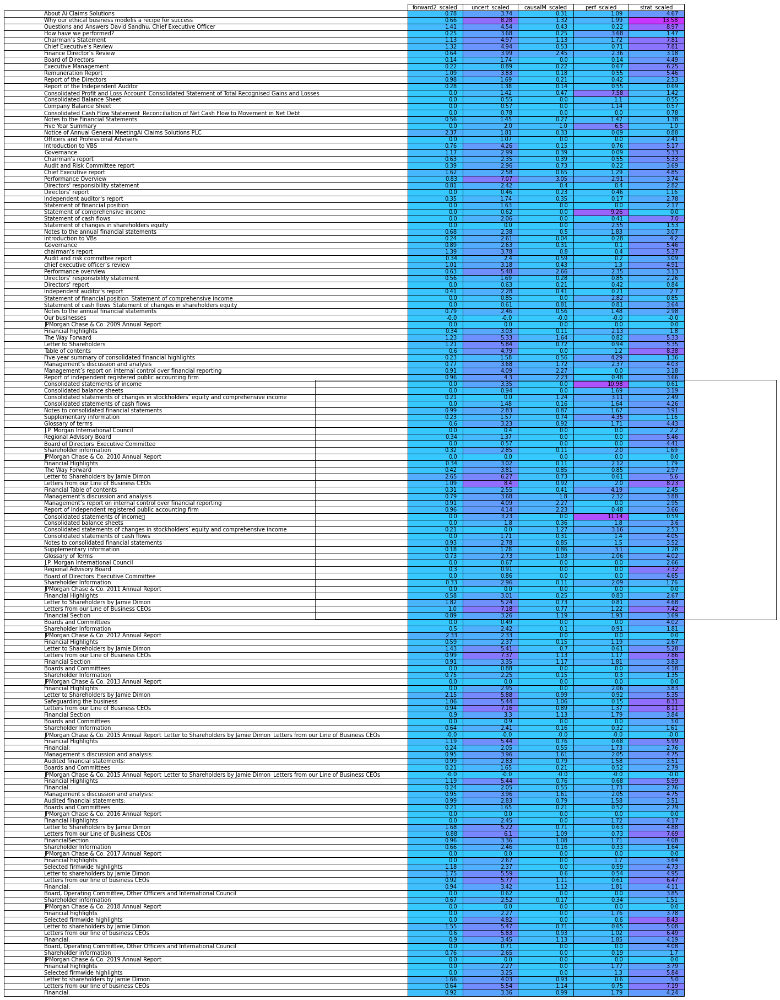

In [ ]:
vals = np.around(plt_df.values*100,2)
norm = plt.Normalize(vals.min()-5, vals.max()+5)
colours = plt.cm.cool(norm(vals))

fig = plt.figure(figsize=(15,8))
ax = fig.add_subplot(111, frameon=True, xticks=[], yticks=[])

countTable=plt.table(cellText=vals, rowLabels=plt_df.index, colLabels=plt_df.columns, 
                    colWidths = [0.12]*vals.shape[1], loc='center', 
                    cellColours=colours)
plt.show()

In [ ]:
 plt_df=count_df.loc[:,['headText','LMtone','H6tone','H8tone']].set_index('headText')

/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 13 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:183: RuntimeWarning: Glyph 13 missing from current font.
  font.set_text(s, 0, flags=flags)


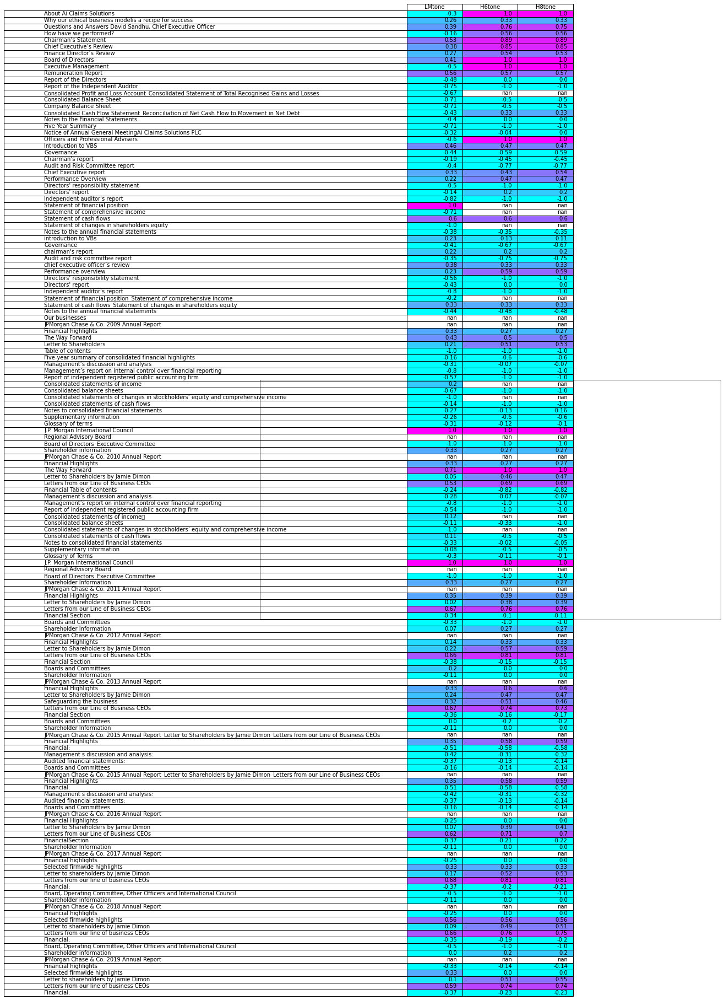

In [ ]:
vals = np.around(plt_df.values,2)
#norm = plt.Normalize(vals.min()-100, vals.max()+100)
colours = plt.cm.cool(vals)

fig = plt.figure(figsize=(15,8))
ax = fig.add_subplot(111, frameon=True, xticks=[], yticks=[])

countTable=plt.table(cellText=vals, rowLabels=plt_df.index, colLabels=plt_df.columns, 
                    colWidths = [0.12]*vals.shape[1], loc='center', 
                    cellColours=colours)
plt.show()

##5.2 Report Analysis

#6 Topic Analysis


*   VBS 2015
*   9. Auditor's report



##6.1Get section text

In [ ]:
header_df.loc[header_df['docID']==docID,['docID', 'headID', 'headNo', 'headText', 'headClass', 'actualPage', 'headPage', 'endPage']]

,docID,headID,headNo,headText,headClass,actualPage,headPage,endPage
5800,357,25974,1,Introduction to VBS,NaN,1.0,5.0,6.0
5801,357,25975,1,Governance,NaN,3.0,7.0,12.0
5802,357,25976,1,Chairman's report,NaN,9.0,13.0,15.0
5803,357,25977,1,Audit and Risk Committee report,NaN,12.0,16.0,19.0
5804,357,25978,1,Chief Executive report,CEO review,16.0,20.0,21.0
5805,357,25979,1,Performance Overview,NaN,18.0,22.0,22.0
5806,357,25980,1,Directors' responsibility statement,NaN,19.0,23.0,23.0
5807,357,25981,1,Directors' report,NaN,20.0,24.0,24.0
5808,357,25982,1,Independent auditor's report,Auditors report,21.0,25.0,25.0
5809,357,25983,1,Statement of financial position,NaN,22.0,26.0,26.0


In [ ]:
header_df.loc[header_df['docID']==docID,'headNo']=header_df.loc[header_df['docID']==docID,'headID']-25973

In [ ]:
header_df.loc[header_df['docID']==docID,['docID', 'headID', 'headNo', 'headText', 'headClass', 'actualPage', 'headPage', 'endPage']]

,docID,headID,headNo,headText,headClass,actualPage,headPage,endPage
5800,357,25974,1,Introduction to VBS,NaN,1.0,5.0,6.0
5801,357,25975,2,Governance,NaN,3.0,7.0,12.0
5802,357,25976,3,Chairman's report,NaN,9.0,13.0,15.0
5803,357,25977,4,Audit and Risk Committee report,NaN,12.0,16.0,19.0
5804,357,25978,5,Chief Executive report,CEO review,16.0,20.0,21.0
5805,357,25979,6,Performance Overview,NaN,18.0,22.0,22.0
5806,357,25980,7,Directors' responsibility statement,NaN,19.0,23.0,23.0
5807,357,25981,8,Directors' report,NaN,20.0,24.0,24.0
5808,357,25982,9,Independent auditor's report,Auditors report,21.0,25.0,25.0
5809,357,25983,10,Statement of financial position,NaN,22.0,26.0,26.0


In [ ]:
pdfStart=int(header_df.loc[(header_df['docID']==docID)&(header_df['headNo']==9),'headPage'].values[0])

In [ ]:
pdfEnd=int(header_df.loc[(header_df['docID']==docID)&(header_df['headNo']==9),'endPage'].values[0]+1)

In [ ]:
for index, pageRow in pageText_df.loc[(pageText_df['docID']==docID)&(pageText_df['pdfPage']>=pdfStart)&(pageText_df['pdfPage']<=pdfEnd)].iterrows():
  print(pageRow['text'])

 KPMG Inc
KPMG Crescent
85 Empire Road, Parktown, 2193
Private Bag 9, Parkview, 2122, South Africa Telephone +27 (0)11 647 7111
Fax +27 (0)11 647 8000
Docex 472 Johannesburg
Web http://www.kpmg.co.za/ Independent Auditor’s Report  To the Shareholders of VBS Mutual Bank 
�������������
We have audited the financial statements of VBS Mutual Bank, which comprise the statement of financial position at 
31 March 2015, and the statements of comprehensive income, changes in equity and cash flows for the year then ended, 
and the notes to the financial statements which include a summary of significant accounting policies and other 
explanatory notes, as set out on pages 22 to 46.  Directors’ Responsibility for the Financial Statements 
��������’s directors are responsible for the preparation and fair presentation of these financial statements in accordance 
with International Financial Reporting Standards and the requirements of the Mutual Banks Act of South Africa, and 
for such internal contr

In [ ]:
header_df.loc[header_df['docID']==docID]

,docID,docName,year,pages,headID,headNo,headLevel,headText,headClass,headItem,score,actualPage,pdfPage,done,headPage,endPage
5800,357,VBS-2015-Annual-Report.pdf,2015,56,25974,1,1,Introduction to VBS,NaN,NaN,-1.0,1.0,5,0,5.0,6.0
5801,357,VBS-2015-Annual-Report.pdf,2015,56,25975,2,1,Governance,NaN,NaN,-1.0,3.0,7,0,7.0,12.0
5802,357,VBS-2015-Annual-Report.pdf,2015,56,25976,3,1,Chairman's report,NaN,NaN,-1.0,9.0,13,0,13.0,15.0
5803,357,VBS-2015-Annual-Report.pdf,2015,56,25977,4,1,Audit and Risk Committee report,NaN,NaN,-1.0,12.0,16,0,16.0,19.0
5804,357,VBS-2015-Annual-Report.pdf,2015,56,25978,5,1,Chief Executive report,CEO review,chiefexecutivesreport,84.0,16.0,20,0,20.0,21.0
5805,357,VBS-2015-Annual-Report.pdf,2015,56,25979,6,1,Performance Overview,NaN,NaN,-1.0,18.0,22,0,22.0,22.0
5806,357,VBS-2015-Annual-Report.pdf,2015,56,25980,7,1,Directors' responsibility statement,NaN,NaN,-1.0,19.0,23,0,23.0,23.0
5807,357,VBS-2015-Annual-Report.pdf,2015,56,25981,8,1,Directors' report,NaN,NaN,-1.0,20.0,24,0,24.0,24.0
5808,357,VBS-2015-Annual-Report.pdf,2015,56,25982,9,1,Independent auditor's report,Auditors report,independentauditorsreport,91.0,21.0,25,0,25.0,25.0
5809,357,VBS-2015-Annual-Report.pdf,2015,56,25983,10,1,Statement of financial position,NaN,NaN,-1.0,22.0,26,0,26.0,26.0


In [ ]:
#Create header columns on page dataframe
pageText_df.loc[pageText_df['docID']==docID,'headID']=-1
pageText_df.loc[pageText_df['docID']==docID,'headNo']=-1
pageText_df.loc[pageText_df['docID']==docID,'headLevel']=-1
pageText_df.loc[pageText_df['docID']==docID,'headText']=''
pageText_df.loc[pageText_df['docID']==docID,'headClass']=''
pageText_df.loc[pageText_df['docID']==docID,'headItem']=''
pageText_df.loc[pageText_df['docID']==docID,'score']=-1
pageText_df.loc[pageText_df['docID']==docID,'actualPage']=-1
pageText_df.loc[pageText_df['docID']==docID,'headPage']=-1
pageText_df.loc[pageText_df['docID']==docID,'endPage']=-1

In [ ]:
pageText_df.loc[pageText_df['docID']==docID]

,docID,docName,year,coID,coName,risk,pageRatio,pages,oldPdfPage,pdfPage,text,wordCount,forward1,forward2,LMneg,LMpos,H6neg,H6pos,H8neg,H8pos,uncert,causal,causalM,causalM50,perf,strat,headID,headNo,headLevel,headText,headClass,headItem,score,actualPage,headPage,endPage
60677,357,VBS-2015-Annual-Report.pdf,2015,1,VBS Mutual Bank,1,1,56,0,0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-1.0,-1.0,-1.0,,,,-1.0,-1.0,-1.0,-1.0
60678,357,VBS-2015-Annual-Report.pdf,2015,1,VBS Mutual Bank,1,1,56,1,1,People with a purpose.,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-1.0,-1.0,-1.0,,,,-1.0,-1.0,-1.0,-1.0
60679,357,VBS-2015-Annual-Report.pdf,2015,1,VBS Mutual Bank,1,1,56,2,2,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-1.0,-1.0,-1.0,,,,-1.0,-1.0,-1.0,-1.0
60680,357,VBS-2015-Annual-Report.pdf,2015,1,VBS Mutual Bank,1,1,56,3,3,“People with a Purpose” We are here to serve our customers and let them gain financially because of our dedicated assistance. To play a meaningful role in our society. To enable our shareholders to obtain their return on investment.,39,0,0,0,2,0,0,0,0,2,2,1,0,0,2,-1.0,-1.0,-1.0,,,,-1.0,-1.0,-1.0,-1.0
60681,357,VBS-2015-Annual-Report.pdf,2015,1,VBS Mutual Bank,1,1,56,4,4,INDEX Introduction to VBS Governance Chairman's report Audit and Risk Committee report Chief Executive report Performance Overview Annual financial statements Directors' responsibility statement Directors' report Independent auditor's report Statement of financial position Statement of comprehensive income Statement of cash flows Statement of changes in shareholders equity Notes to the annual financial statements 1 3 9 12 16 18 19 20 21 22 23 24 25 26,66,0,0,1,0,1,0,1,0,1,1,0,0,1,4,-1.0,-1.0,-1.0,,,,-1.0,-1.0,-1.0,-1.0
60682,357,VBS-2015-Annual-Report.pdf,2015,1,VBS Mutual Bank,1,1,56,5,5,"The Bank is a member of the following organisations: ������� The Banking Association of South Africa (BASA) ������� ������� The Payments Association of South Africa (PASA). ������� BankServ Africa ������� VISA International (associate member) Shareholding profile The bank's largest shareholders are the Public Investment Corporation (25.26%) and Dyambeu Investments (Pty) Ltd (25.22%). Broad Based Black Economic Empowerment Below is a graphical profile of the bank as at 31 March 2015: VBS Mutual Bank is a bona fide BBBEE organisation. The bank is a level 1 contributor with a recognition level of 135% in terms of BBBEE. As at 31 March 2015 black shareholding comprised 99.57% of total shareholding The only share product issued by the bank which qualifies as primary capital is permanent interest bearing shares. The initial subscription of\nR25 million was approved by shareholders of the bank. This subscription has been fully subscribed. The Bank was established in1982 and initially operated as Venda Building Society. The Bank was granted a permanent Mutual Bank License on\n11 October 2000. The Bank currently has 3 branches, located in Thohoyandou, Sibasa and Makhado. The Credit Department is located in Thohoyandou, and it's\n Head Office is located in Makhado. The bank recently opened a Corporate Office in Rivonia, Johannesburg. VBS Mutual Bank is a mutual bank registered with and regulated by the South African Reserve Bank (SARB) under mutual banking license number\n1051, governed by the Mutual Bank's Act, 1993. and Intermediary Services Act, 2002 and operates under FSP license number 30857. NCRCP2. The Bank is registered as an Authorised Financial Services Provider with the Financial Services Board (FSB) in terms of the Financial Advisory The Bank is also registered with the National Credit Regulator in terms of the National Credit Act, 2005 and operates under license number The South African Credit & Risk Reporting Association (SACRRA) At year-end permanent shares to the value of R 23.75 million were in issue. The remaining R1.25 million is reserved for a employee share\nincentive scheme. Shareholding profile\n(Excluding PIC and Dyambeu) 1% 99% African White\nMale Female Staff gender 42% 58% African Whit

In [ ]:
#Set headText_df column values on pageText_df
for headIndex, headRow in header_df.loc[header_df['docID']==docID].iterrows():

    #Get start and end pages for this section
    pdfStart=int(headRow['headPage'])
    pdfEnd=int(headRow['endPage'])
    for pageIndex, pageRow in pageText_df.loc[(pageText_df['docID']==docID)&(pageText_df['pdfPage']>=pdfStart)&(pageText_df['pdfPage']<=pdfEnd)].iterrows():
      #Set column values on page dataframe
      pageText_df.loc[pageIndex,'headID']=headRow['headID']
      pageText_df.loc[pageIndex,'headNo']=headRow['headNo']
      pageText_df.loc[pageIndex,'headLevel']=headRow['headLevel']
      pageText_df.loc[pageIndex,'headText']=headRow['headText']
      pageText_df.loc[pageIndex,'headClass']=headRow['headClass']
      pageText_df.loc[pageIndex,'headItem']=headRow['headItem']
      pageText_df.loc[pageIndex,'score']=headRow['score']
      pageText_df.loc[pageIndex,'actualPage']=headRow['actualPage']
      pageText_df.loc[pageIndex,'headPage']=headRow['headPage']
      pageText_df.loc[pageIndex,'endPage']=headRow['endPage']

In [ ]:
pageText_df.loc[pageText_df['docID']==docID]

,docID,docName,year,coID,coName,risk,pageRatio,pages,oldPdfPage,pdfPage,text,wordCount,forward1,forward2,LMneg,LMpos,H6neg,H6pos,H8neg,H8pos,uncert,causal,causalM,causalM50,perf,strat,headID,headNo,headLevel,headText,headClass,headItem,score,actualPage,headPage,endPage
60677,357,VBS-2015-Annual-Report.pdf,2015,1,VBS Mutual Bank,1,1,56,0,0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-1.0,-1.0,-1.0,,,,-1.0,-1.0,-1.0,-1.0
60678,357,VBS-2015-Annual-Report.pdf,2015,1,VBS Mutual Bank,1,1,56,1,1,People with a purpose.,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-1.0,-1.0,-1.0,,,,-1.0,-1.0,-1.0,-1.0
60679,357,VBS-2015-Annual-Report.pdf,2015,1,VBS Mutual Bank,1,1,56,2,2,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-1.0,-1.0,-1.0,,,,-1.0,-1.0,-1.0,-1.0
60680,357,VBS-2015-Annual-Report.pdf,2015,1,VBS Mutual Bank,1,1,56,3,3,“People with a Purpose” We are here to serve our customers and let them gain financially because of our dedicated assistance. To play a meaningful role in our society. To enable our shareholders to obtain their return on investment.,39,0,0,0,2,0,0,0,0,2,2,1,0,0,2,-1.0,-1.0,-1.0,,,,-1.0,-1.0,-1.0,-1.0
60681,357,VBS-2015-Annual-Report.pdf,2015,1,VBS Mutual Bank,1,1,56,4,4,INDEX Introduction to VBS Governance Chairman's report Audit and Risk Committee report Chief Executive report Performance Overview Annual financial statements Directors' responsibility statement Directors' report Independent auditor's report Statement of financial position Statement of comprehensive income Statement of cash flows Statement of changes in shareholders equity Notes to the annual financial statements 1 3 9 12 16 18 19 20 21 22 23 24 25 26,66,0,0,1,0,1,0,1,0,1,1,0,0,1,4,-1.0,-1.0,-1.0,,,,-1.0,-1.0,-1.0,-1.0
60682,357,VBS-2015-Annual-Report.pdf,2015,1,VBS Mutual Bank,1,1,56,5,5,"The Bank is a member of the following organisations: ������� The Banking Association of South Africa (BASA) ������� ������� The Payments Association of South Africa (PASA). ������� BankServ Africa ������� VISA International (associate member) Shareholding profile The bank's largest shareholders are the Public Investment Corporation (25.26%) and Dyambeu Investments (Pty) Ltd (25.22%). Broad Based Black Economic Empowerment Below is a graphical profile of the bank as at 31 March 2015: VBS Mutual Bank is a bona fide BBBEE organisation. The bank is a level 1 contributor with a recognition level of 135% in terms of BBBEE. As at 31 March 2015 black shareholding comprised 99.57% of total shareholding The only share product issued by the bank which qualifies as primary capital is permanent interest bearing shares. The initial subscription of\nR25 million was approved by shareholders of the bank. This subscription has been fully subscribed. The Bank was established in1982 and initially operated as Venda Building Society. The Bank was granted a permanent Mutual Bank License on\n11 October 2000. The Bank currently has 3 branches, located in Thohoyandou, Sibasa and Makhado. The Credit Department is located in Thohoyandou, and it's\n Head Office is located in Makhado. The bank recently opened a Corporate Office in Rivonia, Johannesburg. VBS Mutual Bank is a mutual bank registered with and regulated by the South African Reserve Bank (SARB) under mutual banking license number\n1051, governed by the Mutual Bank's Act, 1993. and Intermediary Services Act, 2002 and operates under FSP license number 30857. NCRCP2. The Bank is registered as an Authorised Financial Services Provider with the Financial Services Board (FSB) in terms of the Financial Advisory The Bank is also registered with the National Credit Regulator in terms of the National Credit Act, 2005 and operates under license number The South African Credit & Risk Reporting Association (SACRRA) At year-end permanent shares to the value of R 23.75 million were in issue. The remaining R1.25 million is reserved for a employee share\nincentive scheme. Shareholding profile\n(Excluding PIC and Dyambeu) 1% 99% African White\nMale Female Staff gender 42% 58% African Whit

In [ ]:
#Set aggregate function
aggFunc={'headID':'max','headNo':'max','headLevel':'max','headText':'first','headClass':'first','headItem':'first','score':'max','actualPage':'max','headPage':'max','endPage':'max',
'text':' '.join,'wordCount':'sum', 'forward1':'sum','forward2':'sum',
         'LMneg':'sum', 'LMpos':'sum', 'H6neg':'sum', 'H6pos':'sum',
         'H8neg':'sum', 'H8pos':'sum', 'uncert':'sum', 'causal':'sum', 
         'causalM':'sum', 'causalM50':'sum', 'perf':'sum', 'strat':'sum'}

In [ ]:
#Group pages by section
headText_df=pageText_df.loc[pageText_df['docID']==docID].fillna('').groupby(['docID', 'docName', 'year', 'coID', 'coName', 'risk', 'pageRatio','pages','headNo'], as_index=False).agg(aggFunc)

In [ ]:
#Check headText_df
headText_df

docID                     docName  year  ...  causalM50 perf  strat
0     357  VBS-2015-Annual-Report.pdf  2015  ...          0    1      6
1     357  VBS-2015-Annual-Report.pdf  2015  ...          0    5     34
2     357  VBS-2015-Annual-Report.pdf  2015  ...          6    2    124
3     357  VBS-2015-Annual-Report.pdf  2015  ...          3    7     68
4     357  VBS-2015-Annual-Report.pdf  2015  ...         10    4     66
5     357  VBS-2015-Annual-Report.pdf  2015  ...          3    8     30
6     357  VBS-2015-Annual-Report.pdf  2015  ...         13   21     27
7     357  VBS-2015-Annual-Report.pdf  2015  ...          1    1      7
8     357  VBS-2015-Annual-Report.pdf  2015  ...          1    2      5
9     357  VBS-2015-Annual-Report.pdf  2015  ...          2    1     16
10    357  VBS-2015-Annual-Report.pdf  2015  ...          0    0      4
11    357  VBS-2015-Annual-Report.pdf  2015  ...          0   15      0
12    357  VBS-2015-Annual-Report.pdf  2015  ...          0    1     17
13    357  VBS-2015-Annual-Report.pdf  2015  ...          0    5      3
14    357  VBS-2015-Annual-Report.pdf  2015  ...         35  179    302

[15 rows x 34 columns]

##6.2 Word cloud

###6.2.1 Unigram

####6.2.1.1 Scale for frequency on multiple topics

In [ ]:
#Vectorise all features
X_tfidf, vectorizer_tfidf = initialise_tfidf_vectorizer(data=headText_df['text'],ngram=1,featureMax=None)

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"


In [ ]:
tfidf_feature_names=vectorizer_tfidf.get_feature_names()

In [ ]:
#Reduce dimensions using LDA for Auditors report

#Consider 1-5 topics
for n_topics in range(1,6):
  lda_tfidf = fit_LDA(X_tfidf[9], n_components=n_topics)
  wordcloud_topic_freq(lda_tfidf, tfidf_feature_names, featureMax)

Output hidden; open in https://colab.research.google.com to view.

####6.2.2.2 Term Frequency scaling

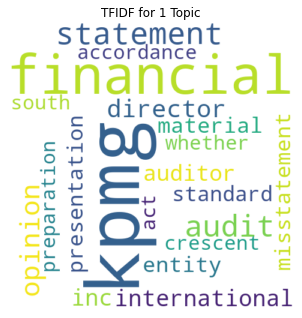

In [ ]:
wordcloud_freq(X_tfidf[9], vectorizer_tfidf, featureMax)

####6.2.1.3 Not scaled for frequency

In [ ]:
#Vectorise limited features
X_tfidf, vectorizer_tfidf = initialise_tfidf_vectorizer(data=headText_df['text'],ngram=1,featureMax=featureMax)

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"


In [ ]:
#Reduce dimensions using LDA and assuming 1 topic for Audit section
lda_tfidf = fit_LDA(X_tfidf[9], n_components=1)

In [ ]:
#Features for Audit section
tfidf_feature_names=vectorizer_tfidf.get_feature_names()

In [ ]:
tfidf_feature_names

['000',
 '2014',
 '2015',
 'asset',
 'audit',
 'bank',
 'board',
 'cash',
 'committee',
 'director',
 'financial',
 'interest',
 'liability',
 'loss',
 'mutual',
 'risk',
 'statement',
 'value',
 'vbs',
 'year']

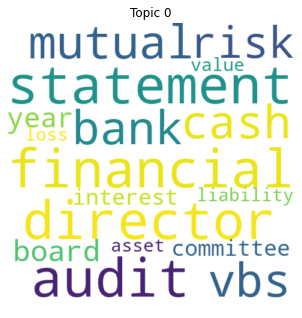

In [ ]:
wordcloud_top_words(lda_tfidf, tfidf_feature_names, featureMax)

###6.2.2 Bigram

####6.2.2.1 Scale for frequency on multiple topics

In [ ]:
#Vectorise all bigrams
X_tfidf2, vectorizer_tfidf2 = initialise_tfidf_vectorizer(data=headText_df['text'],ngram=2,featureMax=None)

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"


In [ ]:
#Reduce dimensions using LDA for Auditor's report

#Consider 1-5 topics
for n_topics in range(1,6):
  lda_tfidf2 = fit_LDA(X_tfidf2[9], n_components=n_topics)
  tfidf_feature_names2=vectorizer_tfidf2.get_feature_names()
  wordcloud_topic_freq(lda_tfidf2, tfidf_feature_names2, featureMax)

Output hidden; open in https://colab.research.google.com to view.

####6.2.2.2 Term Frequency scaling

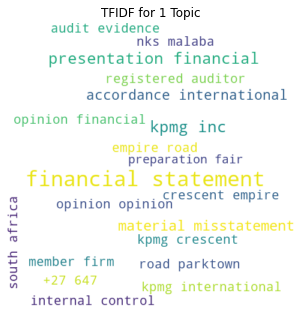

In [ ]:
wordcloud_freq(X_tfidf2[9], vectorizer_tfidf2, featureMax)

####6.2.2.3 Fails: Plots unigrams and does not use frequency

In [ ]:
#Vectorise and reduce dimensions
X_tfidf2, vectorizer_tfidf2 = initialise_tfidf_vectorizer(data=headText_df['text'],ngram=2,featureMax=featureMax)

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"


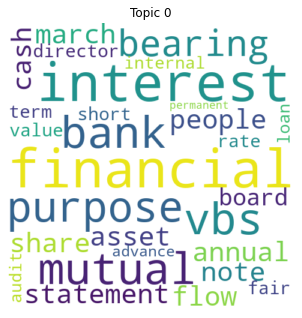

In [ ]:
lda_tfidf2 = fit_LDA(X_tfidf2[9], n_components=1)
tfidf_feature_names2=vectorizer_tfidf2.get_feature_names()
wordcloud_top_words(lda_tfidf2, tfidf_feature_names2, featureMax)

###6.2.3 Trigram

####6.2.2.1 Scale for frequency on multiple topics

In [ ]:
#Vectorise all bigrams
X_tfidf3, vectorizer_tfidf3 = initialise_tfidf_vectorizer(data=headText_df['text'],ngram=3,featureMax=None)

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"


In [ ]:
tfidf_feature_names3=vectorizer_tfidf3.get_feature_names()

In [ ]:
#Reduce dimensions using LDA for Auditor's report

#Consider 1-5 topics
for n_topics in range(1,6):
  lda_tfidf3 = fit_LDA(X_tfidf3[9], n_components=n_topics)
  wordcloud_topic_freq(lda_tfidf3, tfidf_feature_names3, featureMax)

Output hidden; open in https://colab.research.google.com to view.

####6.2.2.2 Term Frequency scaling

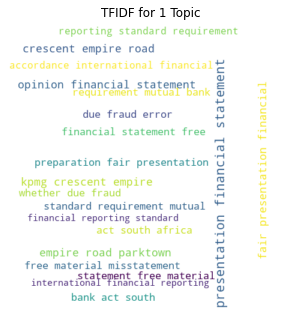

In [ ]:
wordcloud_freq(X_tfidf3[9], vectorizer_tfidf3, featureMax)

####6.2.2.3 Fails: Plots unigrams and does not use frequency

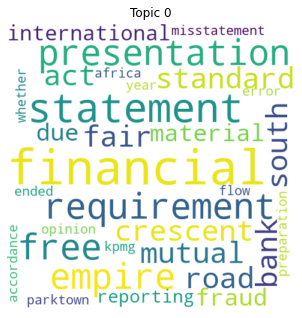

In [ ]:
lda_tfidf3 = fit_LDA(X_tfidf3[9], n_components=1)
wordcloud_top_words(lda_tfidf3, tfidf_feature_names3, featureMax)

###6.2.4 4-gram

####6.2.2.1 Scale for frequency on multiple topics

In [ ]:
#Vectorise all bigrams
X_tfidf4, vectorizer_tfidf4 = initialise_tfidf_vectorizer(data=headText_df['text'],ngram=4,featureMax=None)

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"


In [ ]:
tfidf_feature_names4=vectorizer_tfidf4.get_feature_names()

In [ ]:
#Reduce dimensions using LDA for Auditor's report

#Consider 1-5 topics
for n_topics in range(1,6):
  lda_tfidf4 = fit_LDA(X_tfidf4[9], n_components=n_topics)
  wordcloud_topic_freq(lda_tfidf4, tfidf_feature_names4, featureMax)

Output hidden; open in https://colab.research.google.com to view.

####6.2.2.2 Term Frequency scaling

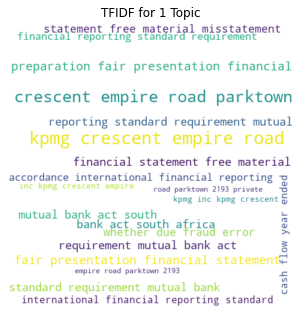

In [ ]:
wordcloud_freq(X_tfidf4[9], vectorizer_tfidf4, featureMax)

####6.2.2.3 Fails: Plots unigrams and does not use frequency

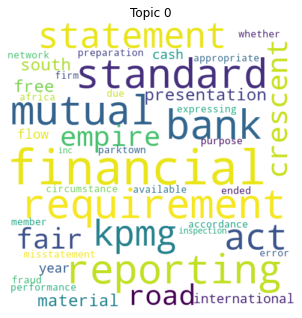

In [ ]:
lda_tfidf4 = fit_LDA(X_tfidf4[9], n_components=1)
wordcloud_top_words(lda_tfidf4, tfidf_feature_names4, featureMax)

###6.2.5 5-gram

####6.2.5.1 Scale for frequency on multiple topics

In [ ]:
#Vectorise all bigrams
X_tfidf5, vectorizer_tfidf5 = initialise_tfidf_vectorizer(data=headText_df['text'],ngram=5,featureMax=None)

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"


In [ ]:
tfidf_feature_names5=vectorizer_tfidf5.get_feature_names()

In [ ]:
#Reduce dimensions using LDA for 9. Auditor's report

#Consider 1-5 topics
for n_topics in range(1,6):
  lda_tfidf5 = fit_LDA(X_tfidf5[9], n_components=n_topics)
  wordcloud_topic_freq(lda_tfidf5, tfidf_feature_names5, featureMax)

Output hidden; open in https://colab.research.google.com to view.

####6.2.2.2 Term Frequency scaling

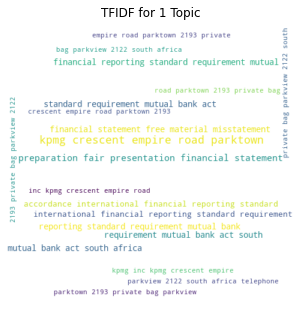

In [ ]:
wordcloud_freq(X_tfidf5[4], vectorizer_tfidf5, featureMax)

####6.2.2.3 Fails: Plots unigrams and does not use frequency

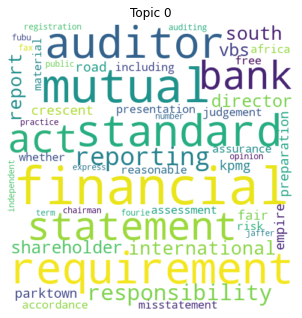

In [ ]:
lda_tfidf5 = fit_LDA(X_tfidf5[9], n_components=1)
wordcloud_top_words(lda_tfidf5, tfidf_feature_names5, featureMax)

#7 Topic Analysis


*   VBS 2016
*   9. Auditor's report



##7.1Get section text

In [ ]:
docID=docID+1

In [ ]:
header_df.loc[header_df['docID']==docID,['docID', 'headID', 'headNo', 'headText', 'headClass', 'actualPage', 'headPage', 'endPage']]

,docID,headID,headNo,headText,headClass,actualPage,headPage,endPage
5814,358,25988,1,introduction to VBs,NaN,14.0,13.0,23.0
5815,358,25989,2,Governance,NaN,25.0,24.0,32.0
5816,358,25990,3,chairman's report,NaN,34.0,33.0,34.0
5817,358,25991,4,Audit and risk committee report,NaN,36.0,35.0,40.0
5818,358,25992,5,chief executive officer’s review,CEO review,42.0,41.0,42.0
5819,358,25993,6,Performance overview,NaN,44.0,43.0,46.0
5820,358,25994,8,Directors' responsibility statement,NaN,48.0,47.0,48.0
5821,358,25995,9,Directors' report,NaN,50.0,49.0,50.0
5822,358,25996,10,Independent auditor's report,Auditors report,52.0,51.0,52.0
5823,358,25997,11,Statement of financial position,NaN,54.0,53.0,53.0


In [ ]:
pdfStart=int(header_df.loc[(header_df['docID']==docID)&(header_df['headNo']==4),'headPage'].values[0])

In [ ]:
pdfEnd=int(header_df.loc[(header_df['docID']==docID)&(header_df['headNo']==4),'endPage'].values[0]+1)

In [ ]:
for index, pageRow in pageText_df.loc[(pageText_df['docID']==docID)&(pageText_df['pdfPage']>=pdfStart)&(pageText_df['pdfPage']<=pdfEnd)].iterrows():
  print(pageRow['text'])

 3 6 3 7 V B S  M u t ua l  B a n k  |  a n n ua l  R e p o R t  |  2 0 1 6 p e o p l e  W i t h  a  p u R p o S e A u d i t  A n d  r i s k  c o M M i t t e e  r e P o r t W
e are pleased to present our report of the Audit and 
Risk Committee “the committee” of VBS Mutual 
Bank appointed for the financial year ended 31 March 
2016 in compliance with the Companies Act and in terms 
of the Mutual Banks Act.  Audit committee charter and terms of reference  The VBS Mutual Bank Audit and Risk ommittee “the 
committee” has adopted a formal charter and terms of 
reference that has been approved by the board of directors. 
The committee has conducted its affairs in compliance 
with this mandate and the terms of reference and has 
discharged its responsibilities contained therein. The 
committee has a charter that complies with the Mutual 
Banks Act and King III requirements. Copies are available 
from the bank secretary on request. composition and membership  The shareholders appointed the co

In [ ]:
header_df.loc[header_df['docID']==docID]

,docID,docName,year,pages,headID,headNo,headLevel,headText,headClass,headItem,score,actualPage,pdfPage,done,headPage,endPage
5814,358,VBS-2016-Annual-Report.pdf,2016,47,25988,1,1,introduction to VBs,NaN,NaN,-1.0,14.0,12,0,13.0,23.0
5815,358,VBS-2016-Annual-Report.pdf,2016,47,25989,2,1,Governance,NaN,NaN,-1.0,25.0,23,0,24.0,32.0
5816,358,VBS-2016-Annual-Report.pdf,2016,47,25990,3,1,chairman's report,NaN,NaN,-1.0,34.0,32,0,33.0,34.0
5817,358,VBS-2016-Annual-Report.pdf,2016,47,25991,4,1,Audit and risk committee report,NaN,NaN,-1.0,36.0,34,0,35.0,40.0
5818,358,VBS-2016-Annual-Report.pdf,2016,47,25992,5,1,chief executive officer’s review,CEO review,chiefexecutiveofficerreview,92.0,42.0,40,0,41.0,42.0
5819,358,VBS-2016-Annual-Report.pdf,2016,47,25993,6,1,Performance overview,NaN,NaN,-1.0,44.0,42,0,43.0,46.0
5820,358,VBS-2016-Annual-Report.pdf,2016,47,25994,8,1,Directors' responsibility statement,NaN,NaN,-1.0,48.0,46,0,47.0,48.0
5821,358,VBS-2016-Annual-Report.pdf,2016,47,25995,9,1,Directors' report,NaN,NaN,-1.0,50.0,48,0,49.0,50.0
5822,358,VBS-2016-Annual-Report.pdf,2016,47,25996,10,1,Independent auditor's report,Auditors report,independentauditorsreport,91.0,52.0,50,0,51.0,52.0
5823,358,VBS-2016-Annual-Report.pdf,2016,47,25997,11,1,Statement of financial position,NaN,NaN,-1.0,54.0,52,0,53.0,53.0


In [ ]:
#Create header columns on page dataframe
pageText_df.loc[pageText_df['docID']==docID,'headID']=-1
pageText_df.loc[pageText_df['docID']==docID,'headNo']=-1
pageText_df.loc[pageText_df['docID']==docID,'headLevel']=-1
pageText_df.loc[pageText_df['docID']==docID,'headText']=''
pageText_df.loc[pageText_df['docID']==docID,'headClass']=''
pageText_df.loc[pageText_df['docID']==docID,'headItem']=''
pageText_df.loc[pageText_df['docID']==docID,'score']=-1
pageText_df.loc[pageText_df['docID']==docID,'actualPage']=-1
pageText_df.loc[pageText_df['docID']==docID,'headPage']=-1
pageText_df.loc[pageText_df['docID']==docID,'endPage']=-1

In [ ]:
pageText_df.loc[pageText_df['docID']==docID]

docID                     docName  year  ...  actualPage headPage  endPage
60733    358  VBS-2016-Annual-Report.pdf  2016  ...        -1.0     -1.0     -1.0
60734    358  VBS-2016-Annual-Report.pdf  2016  ...        -1.0     -1.0     -1.0
60735    358  VBS-2016-Annual-Report.pdf  2016  ...        -1.0     -1.0     -1.0
60736    358  VBS-2016-Annual-Report.pdf  2016  ...        -1.0     -1.0     -1.0
60737    358  VBS-2016-Annual-Report.pdf  2016  ...        -1.0     -1.0     -1.0
...      ...                         ...   ...  ...         ...      ...      ...
60820    358  VBS-2016-Annual-Report.pdf  2016  ...        -1.0     -1.0     -1.0
60821    358  VBS-2016-Annual-Report.pdf  2016  ...        -1.0     -1.0     -1.0
60822    358  VBS-2016-Annual-Report.pdf  2016  ...        -1.0     -1.0     -1.0
60823    358  VBS-2016-Annual-Report.pdf  2016  ...        -1.0     -1.0     -1.0
60824    358  VBS-2016-Annual-Report.pdf  2016  ...        -1.0     -1.0     -1.0

[92 rows x 36 columns]

In [ ]:
#Set headText_df column values on pageText_df
for headIndex, headRow in header_df.loc[header_df['docID']==docID].iterrows():

    #Get start and end pages for this section
    pdfStart=int(headRow['headPage'])
    pdfEnd=int(headRow['endPage'])
    for pageIndex, pageRow in pageText_df.loc[(pageText_df['docID']==docID)&(pageText_df['pdfPage']>=pdfStart)&(pageText_df['pdfPage']<=pdfEnd)].iterrows():
      #Set column values on page dataframe
      pageText_df.loc[pageIndex,'headID']=headRow['headID']
      pageText_df.loc[pageIndex,'headNo']=headRow['headNo']
      pageText_df.loc[pageIndex,'headLevel']=headRow['headLevel']
      pageText_df.loc[pageIndex,'headText']=headRow['headText']
      pageText_df.loc[pageIndex,'headClass']=headRow['headClass']
      pageText_df.loc[pageIndex,'headItem']=headRow['headItem']
      pageText_df.loc[pageIndex,'score']=headRow['score']
      pageText_df.loc[pageIndex,'actualPage']=headRow['actualPage']
      pageText_df.loc[pageIndex,'headPage']=headRow['headPage']
      pageText_df.loc[pageIndex,'endPage']=headRow['endPage']

In [ ]:
pageText_df.loc[pageText_df['docID']==docID]

docID                     docName  year  ...  actualPage headPage  endPage
60733    358  VBS-2016-Annual-Report.pdf  2016  ...        -1.0     -1.0     -1.0
60734    358  VBS-2016-Annual-Report.pdf  2016  ...        -1.0     -1.0     -1.0
60735    358  VBS-2016-Annual-Report.pdf  2016  ...        -1.0     -1.0     -1.0
60736    358  VBS-2016-Annual-Report.pdf  2016  ...        -1.0     -1.0     -1.0
60737    358  VBS-2016-Annual-Report.pdf  2016  ...        -1.0     -1.0     -1.0
...      ...                         ...   ...  ...         ...      ...      ...
60820    358  VBS-2016-Annual-Report.pdf  2016  ...        58.0     57.0     91.0
60821    358  VBS-2016-Annual-Report.pdf  2016  ...        58.0     57.0     91.0
60822    358  VBS-2016-Annual-Report.pdf  2016  ...        58.0     57.0     91.0
60823    358  VBS-2016-Annual-Report.pdf  2016  ...        58.0     57.0     91.0
60824    358  VBS-2016-Annual-Report.pdf  2016  ...        58.0     57.0     91.0

[92 rows x 36 columns]

In [ ]:
#Set aggregate function
aggFunc={'headID':'max','headNo':'max','headLevel':'max','headText':'first','headClass':'first','headItem':'first','score':'max','actualPage':'max','headPage':'max','endPage':'max',
'text':' '.join,'wordCount':'sum', 'forward1':'sum','forward2':'sum',
         'LMneg':'sum', 'LMpos':'sum', 'H6neg':'sum', 'H6pos':'sum',
         'H8neg':'sum', 'H8pos':'sum', 'uncert':'sum', 'causal':'sum', 
         'causalM':'sum', 'causalM50':'sum', 'perf':'sum', 'strat':'sum'}

In [ ]:
#Group pages by section
headText_df=pageText_df.loc[pageText_df['docID']==docID].fillna('').groupby(['docID', 'docName', 'year', 'coID', 'coName', 'risk', 'pageRatio','pages','headNo'], as_index=False).agg(aggFunc)

In [ ]:
#Check headText_df
headText_df

docID                     docName  year  ...  causalM50 perf  strat
0     358  VBS-2016-Annual-Report.pdf  2016  ...          0    2     12
1     358  VBS-2016-Annual-Report.pdf  2016  ...          0    8    148
2     358  VBS-2016-Annual-Report.pdf  2016  ...          6    4    234
3     358  VBS-2016-Annual-Report.pdf  2016  ...          3    2     27
4     358  VBS-2016-Annual-Report.pdf  2016  ...         12    6     89
5     358  VBS-2016-Annual-Report.pdf  2016  ...          2    9     35
6     358  VBS-2016-Annual-Report.pdf  2016  ...         10   15     20
7     358  VBS-2016-Annual-Report.pdf  2016  ...          1    3      9
8     358  VBS-2016-Annual-Report.pdf  2016  ...          1    2      5
9     358  VBS-2016-Annual-Report.pdf  2016  ...          4    2     26
10    358  VBS-2016-Annual-Report.pdf  2016  ...          0   10      3
11    358  VBS-2016-Annual-Report.pdf  2016  ...          0   10      0
12    358  VBS-2016-Annual-Report.pdf  2016  ...          0    4     18
13    358  VBS-2016-Annual-Report.pdf  2016  ...          0    3      1
14    358  VBS-2016-Annual-Report.pdf  2016  ...         72  300    585

[15 rows x 34 columns]

##7.2 Word cloud

###6.2.1 Unigram

####6.2.1.1 Scale for frequency on multiple topics

In [ ]:
#Vectorise all features
X_tfidf, vectorizer_tfidf = initialise_tfidf_vectorizer(data=headText_df['text'],ngram=1,featureMax=None)

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"


In [ ]:
tfidf_feature_names=vectorizer_tfidf.get_feature_names()

In [ ]:
#Reduce dimensions using LDA for 9. Audit's report

#Consider 1-5 topics
for n_topics in range(1,6):
  lda_tfidf = fit_LDA(X_tfidf[9], n_components=n_topics)
  wordcloud_topic_freq(lda_tfidf, tfidf_feature_names, featureMax)

Output hidden; open in https://colab.research.google.com to view.

####6.2.2.2 Term Frequency scaling

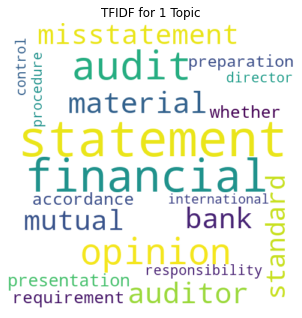

In [ ]:
wordcloud_freq(X_tfidf[9], vectorizer_tfidf, featureMax)

####6.2.1.3 Not scaled for frequency

In [ ]:
#Vectorise limited features
X_tfidf, vectorizer_tfidf = initialise_tfidf_vectorizer(data=headText_df['text'],ngram=1,featureMax=featureMax)

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"


In [ ]:
#Reduce dimensions using LDA and assuming 1 topic for Audit section
lda_tfidf = fit_LDA(X_tfidf[9], n_components=1)

In [ ]:
#Features for Audit section
tfidf_feature_names=vectorizer_tfidf.get_feature_names()

In [ ]:
tfidf_feature_names

['000',
 '2015',
 '2016',
 'amount',
 'asset',
 'audit',
 'bank',
 'board',
 'cash',
 'committee',
 'director',
 'financial',
 'impairment',
 'interest',
 'liability',
 'loan',
 'management',
 'risk',
 'value',
 'year']

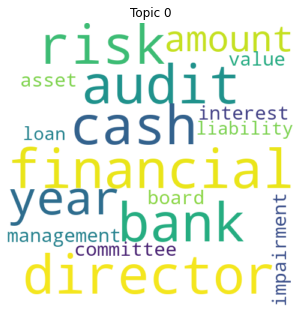

In [ ]:
wordcloud_top_words(lda_tfidf, tfidf_feature_names, featureMax)

###6.2.2 Bigram

####6.2.2.1 Scale for frequency on multiple topics

In [ ]:
#Vectorise all bigrams
X_tfidf2, vectorizer_tfidf2 = initialise_tfidf_vectorizer(data=headText_df['text'],ngram=2,featureMax=None)

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"


In [ ]:
#Reduce dimensions using LDA for 9. Auditor's report

#Consider 1-5 topics
for n_topics in range(1,6):
  lda_tfidf2 = fit_LDA(X_tfidf2[9], n_components=n_topics)
  tfidf_feature_names2=vectorizer_tfidf2.get_feature_names()
  wordcloud_topic_freq(lda_tfidf2, tfidf_feature_names2, featureMax)

Output hidden; open in https://colab.research.google.com to view.

####6.2.2.2 Term Frequency scaling

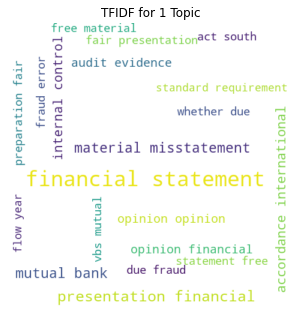

In [ ]:
wordcloud_freq(X_tfidf2[9], vectorizer_tfidf2, featureMax)

####6.2.2.3 Fails: Plots unigrams and does not use frequency

In [ ]:
#Vectorise and reduce dimensions
X_tfidf2, vectorizer_tfidf2 = initialise_tfidf_vectorizer(data=headText_df['text'],ngram=2,featureMax=featureMax)

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"


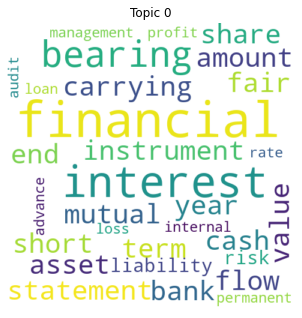

In [ ]:
lda_tfidf2 = fit_LDA(X_tfidf2[9], n_components=1)
tfidf_feature_names2=vectorizer_tfidf2.get_feature_names()
wordcloud_top_words(lda_tfidf2, tfidf_feature_names2, featureMax)

###6.2.3 Trigram

####6.2.2.1 Scale for frequency on multiple topics

In [ ]:
#Vectorise all bigrams
X_tfidf3, vectorizer_tfidf3 = initialise_tfidf_vectorizer(data=headText_df['text'],ngram=3,featureMax=None)

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"


In [ ]:
#Reduce dimensions using LDA for Audit section

#Consider 1-5 topics
for n_topics in range(1,6):
  lda_tfidf3 = fit_LDA(X_tfidf3[9], n_components=n_topics)
  tfidf_feature_names3=vectorizer_tfidf3.get_feature_names()
  wordcloud_topic_freq(lda_tfidf3, tfidf_feature_names3, featureMax)

Output hidden; open in https://colab.research.google.com to view.

####6.2.2.2 Term Frequency scaling

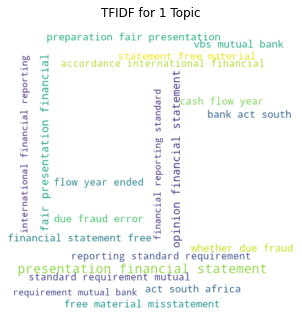

In [ ]:
wordcloud_freq(X_tfidf3[9], vectorizer_tfidf3, featureMax)

####6.2.2.3 Fails: Plots unigrams and does not use frequency

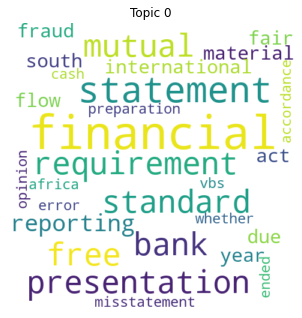

In [ ]:
lda_tfidf3 = fit_LDA(X_tfidf3[9], n_components=1)
wordcloud_top_words(lda_tfidf3, tfidf_feature_names3, featureMax)

###6.2.4 4-gram

####6.2.2.1 Scale for frequency on multiple topics

In [ ]:
#Vectorise all bigrams
X_tfidf4, vectorizer_tfidf4 = initialise_tfidf_vectorizer(data=headText_df['text'],ngram=4,featureMax=None)

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"


In [ ]:
tfidf_feature_names4=vectorizer_tfidf4.get_feature_names()

In [ ]:
#Reduce dimensions using LDA for Audit section

#Consider 1-5 topics
for n_topics in range(1,6):
  lda_tfidf4 = fit_LDA(X_tfidf4[9], n_components=n_topics)
  wordcloud_topic_freq(lda_tfidf4, tfidf_feature_names4, featureMax)

Output hidden; open in https://colab.research.google.com to view.

####6.2.2.2 Term Frequency scaling

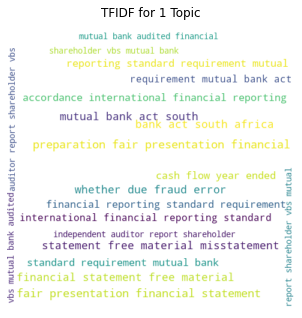

In [ ]:
wordcloud_freq(X_tfidf4[9], vectorizer_tfidf4, featureMax)

####6.2.2.3 Fails: Plots unigrams and does not use frequency

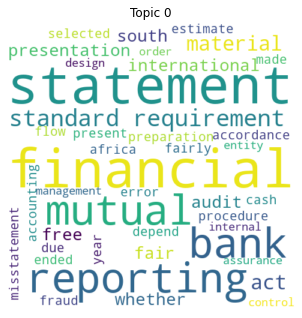

In [ ]:
lda_tfidf4 = fit_LDA(X_tfidf4[9], n_components=1)
wordcloud_top_words(lda_tfidf4, tfidf_feature_names4, featureMax)

###6.2.5 5-gram

####6.2.5.1 Scale for frequency on multiple topics

In [ ]:
#Vectorise all bigrams
X_tfidf5, vectorizer_tfidf5 = initialise_tfidf_vectorizer(data=headText_df['text'],ngram=5,featureMax=None)

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"


In [ ]:
tfidf_feature_names5=vectorizer_tfidf5.get_feature_names()

In [ ]:
#Reduce dimensions using LDA for Audit section

#Consider 1-5 topics
for n_topics in range(1,6):
  lda_tfidf5 = fit_LDA(X_tfidf5[9], n_components=n_topics)
  wordcloud_topic_freq(lda_tfidf5, tfidf_feature_names5, featureMax)

Output hidden; open in https://colab.research.google.com to view.

####6.2.2.2 Term Frequency scaling

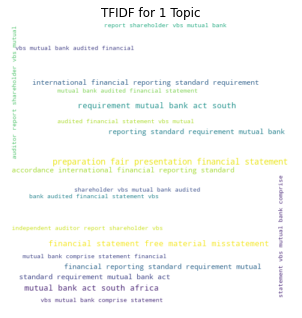

In [ ]:
wordcloud_freq(X_tfidf5[9], vectorizer_tfidf5, featureMax)

####6.2.2.3 Fails: Plots unigrams and does not use frequency

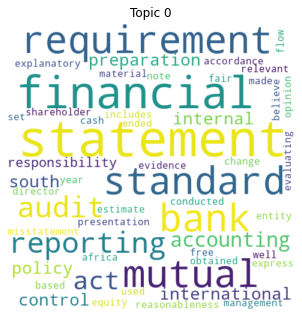

In [ ]:
lda_tfidf5 = fit_LDA(X_tfidf5[9], n_components=1)
wordcloud_top_words(lda_tfidf5, tfidf_feature_names5, featureMax)

#8 Topic Analysis


*   VBS 2016
*   4. Auditor and risk committee report


##8.1Get section text

In [ ]:
header_df.loc[header_df['docID']==docID,['docID', 'headID', 'headNo', 'headText', 'headClass', 'actualPage', 'headPage', 'endPage']]

,docID,headID,headNo,headText,headClass,actualPage,headPage,endPage
5814,358,25988,1,introduction to VBs,NaN,14.0,13.0,23.0
5815,358,25989,2,Governance,NaN,25.0,24.0,32.0
5816,358,25990,3,chairman's report,NaN,34.0,33.0,34.0
5817,358,25991,4,Audit and risk committee report,NaN,36.0,35.0,40.0
5818,358,25992,5,chief executive officer’s review,CEO review,42.0,41.0,42.0
5819,358,25993,6,Performance overview,NaN,44.0,43.0,46.0
5820,358,25994,8,Directors' responsibility statement,NaN,48.0,47.0,48.0
5821,358,25995,9,Directors' report,NaN,50.0,49.0,50.0
5822,358,25996,10,Independent auditor's report,Auditors report,52.0,51.0,52.0
5823,358,25997,11,Statement of financial position,NaN,54.0,53.0,53.0


In [ ]:
pdfStart=int(header_df.loc[(header_df['docID']==docID)&(header_df['headNo']==4),'headPage'].values[0])

In [ ]:
pdfEnd=int(header_df.loc[(header_df['docID']==docID)&(header_df['headNo']==4),'endPage'].values[0]+1)

In [ ]:
for index, pageRow in pageText_df.loc[(pageText_df['docID']==docID)&(pageText_df['pdfPage']>=pdfStart)&(pageText_df['pdfPage']<=pdfEnd)].iterrows():
  print(pageRow['text'])

 3 6 3 7 V B S  M u t ua l  B a n k  |  a n n ua l  R e p o R t  |  2 0 1 6 p e o p l e  W i t h  a  p u R p o S e A u d i t  A n d  r i s k  c o M M i t t e e  r e P o r t W
e are pleased to present our report of the Audit and 
Risk Committee “the committee” of VBS Mutual 
Bank appointed for the financial year ended 31 March 
2016 in compliance with the Companies Act and in terms 
of the Mutual Banks Act.  Audit committee charter and terms of reference  The VBS Mutual Bank Audit and Risk ommittee “the 
committee” has adopted a formal charter and terms of 
reference that has been approved by the board of directors. 
The committee has conducted its affairs in compliance 
with this mandate and the terms of reference and has 
discharged its responsibilities contained therein. The 
committee has a charter that complies with the Mutual 
Banks Act and King III requirements. Copies are available 
from the bank secretary on request. composition and membership  The shareholders appointed the co

In [ ]:
header_df.loc[header_df['docID']==docID]

,docID,docName,year,pages,headID,headNo,headLevel,headText,headClass,headItem,score,actualPage,pdfPage,done,headPage,endPage
5814,358,VBS-2016-Annual-Report.pdf,2016,47,25988,1,1,introduction to VBs,NaN,NaN,-1.0,14.0,12,0,13.0,23.0
5815,358,VBS-2016-Annual-Report.pdf,2016,47,25989,2,1,Governance,NaN,NaN,-1.0,25.0,23,0,24.0,32.0
5816,358,VBS-2016-Annual-Report.pdf,2016,47,25990,3,1,chairman's report,NaN,NaN,-1.0,34.0,32,0,33.0,34.0
5817,358,VBS-2016-Annual-Report.pdf,2016,47,25991,4,1,Audit and risk committee report,NaN,NaN,-1.0,36.0,34,0,35.0,40.0
5818,358,VBS-2016-Annual-Report.pdf,2016,47,25992,5,1,chief executive officer’s review,CEO review,chiefexecutiveofficerreview,92.0,42.0,40,0,41.0,42.0
5819,358,VBS-2016-Annual-Report.pdf,2016,47,25993,6,1,Performance overview,NaN,NaN,-1.0,44.0,42,0,43.0,46.0
5820,358,VBS-2016-Annual-Report.pdf,2016,47,25994,8,1,Directors' responsibility statement,NaN,NaN,-1.0,48.0,46,0,47.0,48.0
5821,358,VBS-2016-Annual-Report.pdf,2016,47,25995,9,1,Directors' report,NaN,NaN,-1.0,50.0,48,0,49.0,50.0
5822,358,VBS-2016-Annual-Report.pdf,2016,47,25996,10,1,Independent auditor's report,Auditors report,independentauditorsreport,91.0,52.0,50,0,51.0,52.0
5823,358,VBS-2016-Annual-Report.pdf,2016,47,25997,11,1,Statement of financial position,NaN,NaN,-1.0,54.0,52,0,53.0,53.0


In [ ]:
#Create header columns on page dataframe
pageText_df.loc[pageText_df['docID']==docID,'headID']=-1
pageText_df.loc[pageText_df['docID']==docID,'headNo']=-1
pageText_df.loc[pageText_df['docID']==docID,'headLevel']=-1
pageText_df.loc[pageText_df['docID']==docID,'headText']=''
pageText_df.loc[pageText_df['docID']==docID,'headClass']=''
pageText_df.loc[pageText_df['docID']==docID,'headItem']=''
pageText_df.loc[pageText_df['docID']==docID,'score']=-1
pageText_df.loc[pageText_df['docID']==docID,'actualPage']=-1
pageText_df.loc[pageText_df['docID']==docID,'headPage']=-1
pageText_df.loc[pageText_df['docID']==docID,'endPage']=-1

In [ ]:
pageText_df.loc[pageText_df['docID']==docID]

,docID,docName,year,coID,coName,risk,pageRatio,pages,oldPdfPage,pdfPage,text,wordCount,forward1,forward2,LMneg,LMpos,H6neg,H6pos,H8neg,H8pos,uncert,causal,causalM,causalM50,perf,strat,headID,headNo,headLevel,headText,headClass,headItem,score,actualPage,headPage,endPage
60733,358,VBS-2016-Annual-Report.pdf,2016,1,VBS Mutual Bank,1,2,47,0,0,A n n u A l \nR e p o R t\n2 0 1 6,16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-1.0,-1.0,-1.0,,,,-1.0,-1.0,-1.0,-1.0
60734,358,VBS-2016-Annual-Report.pdf,2016,1,VBS Mutual Bank,1,2,47,1,1,People with a Purpose We are here ...,39,0,0,0,2,0,0,0,0,2,2,1,0,0,2,-1.0,-1.0,-1.0,,,,-1.0,-1.0,-1.0,-1.0
60735,358,VBS-2016-Annual-Report.pdf,2016,1,VBS Mutual Bank,1,2,47,1,2,People with a Purpose We are here ...,39,0,0,0,2,0,0,0,0,2,2,1,0,0,2,-1.0,-1.0,-1.0,,,,-1.0,-1.0,-1.0,-1.0
60736,358,VBS-2016-Annual-Report.pdf,2016,1,VBS Mutual Bank,1,2,47,2,3,P e o P l e W i t h A P u r P o ...,49,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-1.0,-1.0,-1.0,,,,-1.0,-1.0,-1.0,-1.0
60737,358,VBS-2016-Annual-Report.pdf,2016,1,VBS Mutual Bank,1,2,47,2,4,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-1.0,-1.0,-1.0,,,,-1.0,-1.0,-1.0,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60820,358,VBS-2016-Annual-Report.pdf,2016,1,VBS Mutual Bank,1,2,47,44,87,8 8 8 9 V B S M u t ua l B a n k ...,827,2,3,4,4,4,1,4,1,16,20,5,4,0,42,-1.0,-1.0,-1.0,,,,-1.0,-1.0,-1.0,-1.0
60821,358,VBS-2016-Annual-Report.pdf,2016,1,VBS Mutual Bank,1,2,47,44,88,21\nFair values of financial instru...,105,0,0,0,1,0,0,0,0,2,0,0,0,0,4,-1.0,-1.0,-1.0,,,,-1.0,-1.0,-1.0,-1.0
60822,358,VBS-2016-Annual-Report.pdf,2016,1,VBS Mutual Bank,1,2,47,45,89,9 0 9 1 V B S M u t ua l B a n k ...,437,3,3,6,2,3,1,3,1,8,1,0,0,1,7,-1.0,-1.0,-1.0,,,,-1.0,-1.0,-1.0,-1.0
60823,358,VBS-2016-Annual-Report.pdf,2016,1,VBS Mutual Bank,1,2,47,45,90,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-1.0,-1.0,-1.0,,,,-1.0,-1.0,-1.0,-1.0


In [ ]:
#Set headText_df column values on pageText_df
for headIndex, headRow in header_df.loc[header_df['docID']==docID].iterrows():

    #Get start and end pages for this section
    pdfStart=int(headRow['headPage'])
    pdfEnd=int(headRow['endPage'])
    for pageIndex, pageRow in pageText_df.loc[(pageText_df['docID']==docID)&(pageText_df['pdfPage']>=pdfStart)&(pageText_df['pdfPage']<=pdfEnd)].iterrows():
      #Set column values on page dataframe
      pageText_df.loc[pageIndex,'headID']=headRow['headID']
      pageText_df.loc[pageIndex,'headNo']=headRow['headNo']
      pageText_df.loc[pageIndex,'headLevel']=headRow['headLevel']
      pageText_df.loc[pageIndex,'headText']=headRow['headText']
      pageText_df.loc[pageIndex,'headClass']=headRow['headClass']
      pageText_df.loc[pageIndex,'headItem']=headRow['headItem']
      pageText_df.loc[pageIndex,'score']=headRow['score']
      pageText_df.loc[pageIndex,'actualPage']=headRow['actualPage']
      pageText_df.loc[pageIndex,'headPage']=headRow['headPage']
      pageText_df.loc[pageIndex,'endPage']=headRow['endPage']

In [ ]:
pageText_df.loc[pageText_df['docID']==docID]

,docID,docName,year,coID,coName,risk,pageRatio,pages,oldPdfPage,pdfPage,text,wordCount,forward1,forward2,LMneg,LMpos,H6neg,H6pos,H8neg,H8pos,uncert,causal,causalM,causalM50,perf,strat,headID,headNo,headLevel,headText,headClass,headItem,score,actualPage,headPage,endPage
60733,358,VBS-2016-Annual-Report.pdf,2016,1,VBS Mutual Bank,1,2,47,0,0,A n n u A l \nR e p o R t\n2 0 1 6,16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-1.0,-1.0,-1.0,,,,-1.0,-1.0,-1.0,-1.0
60734,358,VBS-2016-Annual-Report.pdf,2016,1,VBS Mutual Bank,1,2,47,1,1,People with a Purpose We are here ...,39,0,0,0,2,0,0,0,0,2,2,1,0,0,2,-1.0,-1.0,-1.0,,,,-1.0,-1.0,-1.0,-1.0
60735,358,VBS-2016-Annual-Report.pdf,2016,1,VBS Mutual Bank,1,2,47,1,2,People with a Purpose We are here ...,39,0,0,0,2,0,0,0,0,2,2,1,0,0,2,-1.0,-1.0,-1.0,,,,-1.0,-1.0,-1.0,-1.0
60736,358,VBS-2016-Annual-Report.pdf,2016,1,VBS Mutual Bank,1,2,47,2,3,P e o P l e W i t h A P u r P o ...,49,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-1.0,-1.0,-1.0,,,,-1.0,-1.0,-1.0,-1.0
60737,358,VBS-2016-Annual-Report.pdf,2016,1,VBS Mutual Bank,1,2,47,2,4,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-1.0,-1.0,-1.0,,,,-1.0,-1.0,-1.0,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60820,358,VBS-2016-Annual-Report.pdf,2016,1,VBS Mutual Bank,1,2,47,44,87,8 8 8 9 V B S M u t ua l B a n k ...,827,2,3,4,4,4,1,4,1,16,20,5,4,0,42,26001.0,15.0,1.0,Notes to the annual financial statem...,NaN,NaN,-1.0,58.0,57.0,91.0
60821,358,VBS-2016-Annual-Report.pdf,2016,1,VBS Mutual Bank,1,2,47,44,88,21\nFair values of financial instru...,105,0,0,0,1,0,0,0,0,2,0,0,0,0,4,26001.0,15.0,1.0,Notes to the annual financial statem...,NaN,NaN,-1.0,58.0,57.0,91.0
60822,358,VBS-2016-Annual-Report.pdf,2016,1,VBS Mutual Bank,1,2,47,45,89,9 0 9 1 V B S M u t ua l B a n k ...,437,3,3,6,2,3,1,3,1,8,1,0,0,1,7,26001.0,15.0,1.0,Notes to the annual financial statem...,NaN,NaN,-1.0,58.0,57.0,91.0
60823,358,VBS-2016-Annual-Report.pdf,2016,1,VBS Mutual Bank,1,2,47,45,90,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,26001.0,15.0,1.0,Notes to the annual financial statem...,NaN,NaN,-1.0,58.0,57.0,91.0


In [ ]:
#Set aggregate function
aggFunc={'headID':'max','headNo':'max','headLevel':'max','headText':'first','headClass':'first','headItem':'first','score':'max','actualPage':'max','headPage':'max','endPage':'max',
'text':' '.join,'wordCount':'sum', 'forward1':'sum','forward2':'sum',
         'LMneg':'sum', 'LMpos':'sum', 'H6neg':'sum', 'H6pos':'sum',
         'H8neg':'sum', 'H8pos':'sum', 'uncert':'sum', 'causal':'sum', 
         'causalM':'sum', 'causalM50':'sum', 'perf':'sum', 'strat':'sum'}

In [ ]:
#Group pages by section
headText_df=pageText_df.loc[pageText_df['docID']==docID].fillna('').groupby(['docID', 'docName', 'year', 'coID', 'coName', 'risk', 'pageRatio','pages','headNo'], as_index=False).agg(aggFunc)

In [ ]:
#Check headText_df
headText_df

,docID,docName,year,coID,coName,risk,pageRatio,pages,headID,headNo,headLevel,headText,headClass,headItem,score,actualPage,headPage,endPage,text,wordCount,forward1,forward2,LMneg,LMpos,H6neg,H6pos,H8neg,H8pos,uncert,causal,causalM,causalM50,perf,strat
0,358,VBS-2016-Annual-Report.pdf,2016,1,VBS Mutual Bank,1,2,47,-1.0,-1.0,-1.0,,,,-1.0,-1.0,-1.0,-1.0,A n n u A l \nR e p o R t\n2 0 1 6 ...,498,0,0,2,4,2,0,2,0,6,6,2,0,2,12
1,358,VBS-2016-Annual-Report.pdf,2016,1,VBS Mutual Bank,1,2,47,25988.0,1.0,1.0,introduction to VBs,,,-1.0,14.0,13.0,23.0,1 4 1 5 V B S M u t ua l B a n k ...,3441,4,6,32,55,25,34,25,33,88,4,1,0,8,148
2,358,VBS-2016-Annual-Report.pdf,2016,1,VBS Mutual Bank,1,2,47,25989.0,2.0,1.0,Governance,,,-1.0,25.0,24.0,32.0,G o V e r n A n c e 2 6 2 7 V B S ...,3978,33,39,59,24,48,10,48,10,102,44,10,6,4,234
3,358,VBS-2016-Annual-Report.pdf,2016,1,VBS Mutual Bank,1,2,47,25990.0,3.0,1.0,chairman's report,,,-1.0,34.0,33.0,34.0,3 4 3 5 V B S M u t ua l B a n k ...,512,7,7,9,14,6,9,6,9,19,4,4,3,2,27
4,358,VBS-2016-Annual-Report.pdf,2016,1,VBS Mutual Bank,1,2,47,25991.0,4.0,1.0,Audit and risk committee report,,,-1.0,36.0,35.0,40.0,3 6 3 7 V B S M u t ua l B a n k ...,2603,11,11,47,19,33,3,33,3,73,67,15,12,6,89
5,358,VBS-2016-Annual-Report.pdf,2016,1,VBS Mutual Bank,1,2,47,25992.0,5.0,1.0,chief executive officer’s review,CEO review,chiefexecutiveofficerreview,92.0,42.0,41.0,42.0,4 3 P e o P l e W i t h A P u r ...,733,5,7,10,22,8,16,8,16,22,6,3,2,9,35
6,358,VBS-2016-Annual-Report.pdf,2016,1,VBS Mutual Bank,1,2,47,25993.0,6.0,1.0,Performance overview,,,-1.0,44.0,43.0,46.0,4 4 4 5 V B S M u t ua l B a n k ...,662,4,4,17,27,6,23,6,23,35,10,17,10,15,20
7,358,VBS-2016-Annual-Report.pdf,2016,1,VBS Mutual Bank,1,2,47,25994.0,8.0,1.0,Directors' responsibility statement,,,-1.0,48.0,47.0,48.0,4 8 4 9 V B S M u t ua l B a n k ...,369,2,2,7,2,1,0,1,0,6,5,1,1,3,9
8,358,VBS-2016-Annual-Report.pdf,2016,1,VBS Mutual Bank,1,2,47,25995.0,9.0,1.0,Directors' report,,,-1.0,50.0,49.0,50.0,5 0 5 1 V B S M u t ua l B a n k ...,527,0,0,5,2,2,2,2,2,3,0,1,1,2,5
9,358,VBS-2016-Annual-Report.pdf,2016,1,VBS Mutual Bank,1,2,47,25996.0,10.0,1.0,Independent auditor's report,Auditors report,independentauditorsreport,91.0,52.0,51.0,52.0,5 2 V B S M u t ua l B a n k | ...,900,4,4,18,2,4,0,4,0,22,24,4,4,2,26


##8.2 Word cloud

###6.2.1 Unigram

####6.2.1.1 Scale for frequency on multiple topics

In [ ]:
#Vectorise all features
X_tfidf, vectorizer_tfidf = initialise_tfidf_vectorizer(data=headText_df['text'],ngram=1,featureMax=None)

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"


In [ ]:
tfidf_feature_names=vectorizer_tfidf.get_feature_names()

Topic 1 of 2


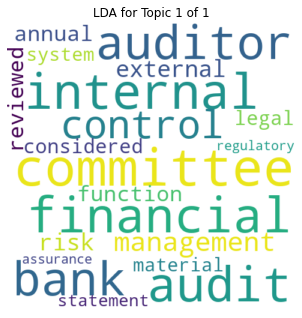

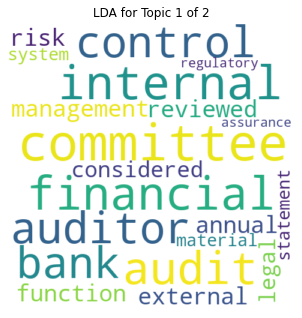

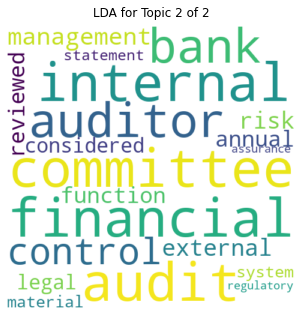

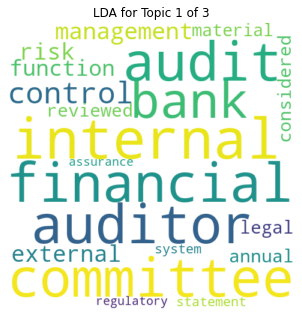

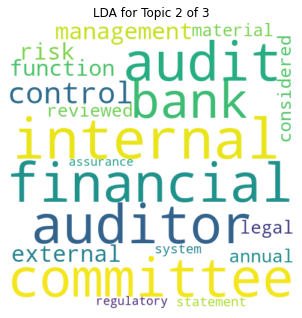

...

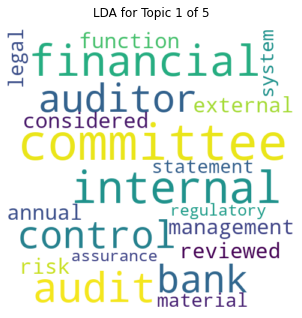

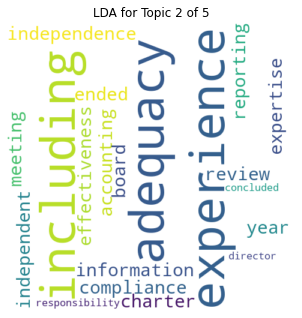

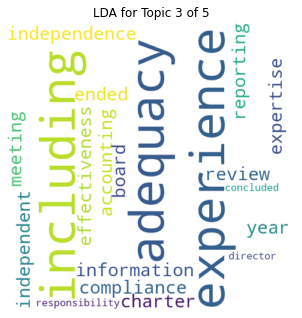

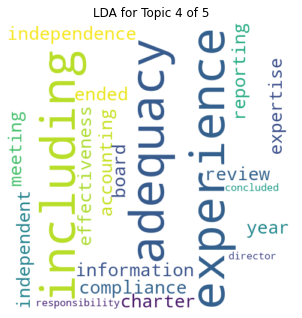

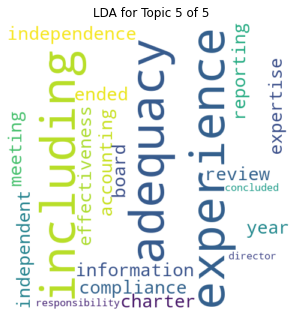

In [ ]:
#Reduce dimensions using LDA for Audit section

#Consider 1-5 topics
for n_topics in range(1,6):
  lda_tfidf = fit_LDA(X_tfidf[4], n_components=n_topics)
  wordcloud_topic_freq(lda_tfidf, tfidf_feature_names, featureMax)

####6.2.2.2 Term Frequency scaling

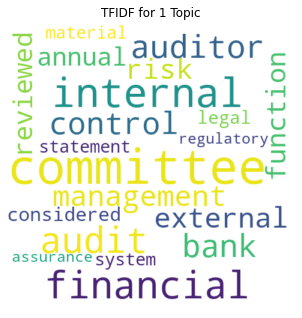

In [ ]:
wordcloud_freq(X_tfidf[4], vectorizer_tfidf, featureMax)

####6.2.1.3 Not scaled for frequency

In [ ]:
#Vectorise limited features
X_tfidf, vectorizer_tfidf = initialise_tfidf_vectorizer(data=headText_df['text'],ngram=1,featureMax=featureMax)

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"


In [ ]:
#Reduce dimensions using LDA and assuming 1 topic for Audit section
lda_tfidf = fit_LDA(X_tfidf[4], n_components=1)

In [ ]:
#Features for Audit section
tfidf_feature_names=vectorizer_tfidf.get_feature_names()

In [ ]:
tfidf_feature_names

['000',
 '2015',
 '2016',
 'amount',
 'asset',
 'audit',
 'bank',
 'board',
 'cash',
 'committee',
 'director',
 'financial',
 'impairment',
 'interest',
 'liability',
 'loan',
 'management',
 'risk',
 'value',
 'year']

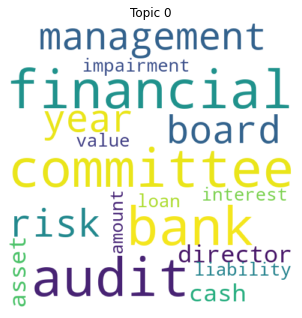

In [ ]:
wordcloud_top_words(lda_tfidf, tfidf_feature_names, featureMax)

###6.2.2 Bigram

####6.2.2.1 Scale for frequency on multiple topics

In [ ]:
#Vectorise all bigrams
X_tfidf2, vectorizer_tfidf2 = initialise_tfidf_vectorizer(data=headText_df['text'],ngram=2,featureMax=None)

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"


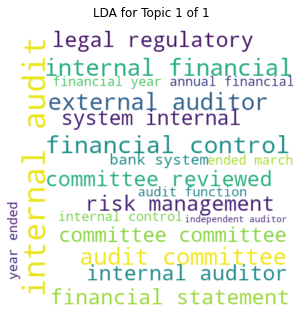

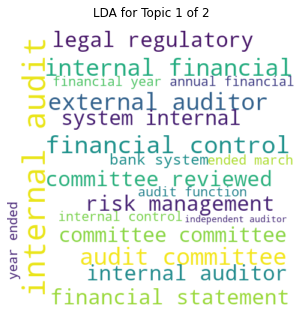

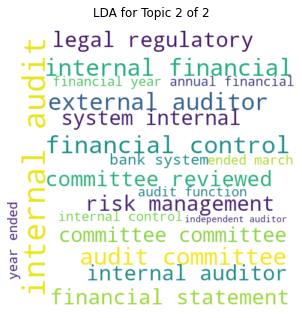

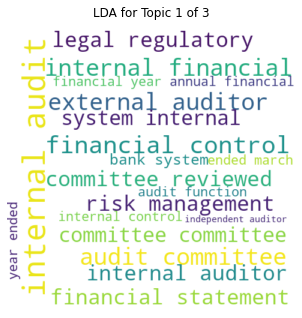

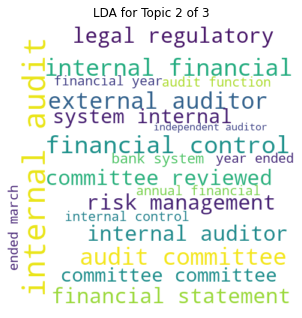

...

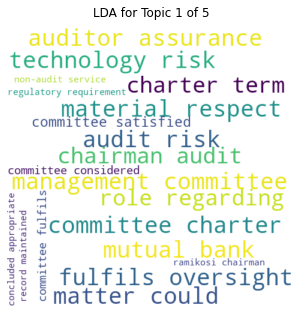

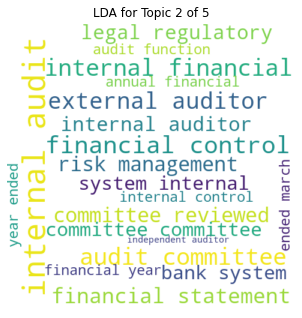

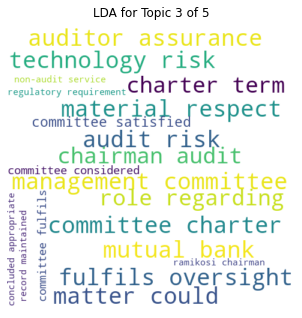

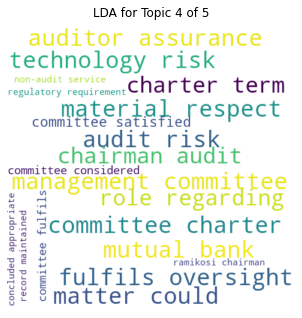

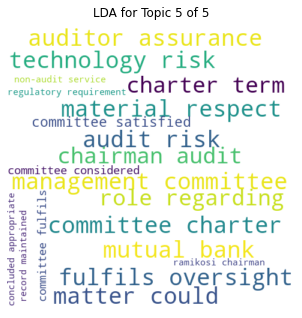

In [ ]:
#Reduce dimensions using LDA for Audit section

#Consider 1-5 topics
for n_topics in range(1,6):
  lda_tfidf2 = fit_LDA(X_tfidf2[4], n_components=n_topics)
  tfidf_feature_names2=vectorizer_tfidf2.get_feature_names()
  wordcloud_topic_freq(lda_tfidf2, tfidf_feature_names2, featureMax)

####6.2.2.2 Term Frequency scaling

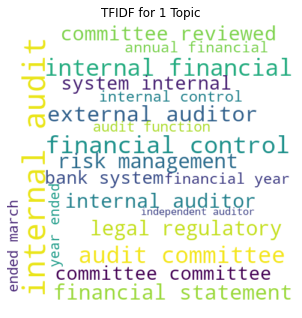

In [ ]:
wordcloud_freq(X_tfidf2[4], vectorizer_tfidf2, featureMax)

####6.2.2.3 Fails: Plots unigrams and does not use frequency

In [ ]:
#Vectorise and reduce dimensions
X_tfidf2, vectorizer_tfidf2 = initialise_tfidf_vectorizer(data=headText_df['text'],ngram=2,featureMax=featureMax)

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"


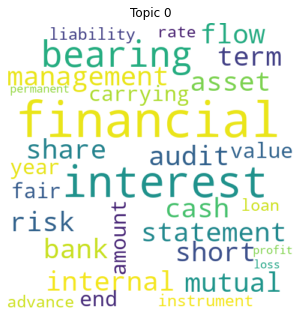

In [ ]:
lda_tfidf2 = fit_LDA(X_tfidf2[4], n_components=1)
tfidf_feature_names2=vectorizer_tfidf2.get_feature_names()
wordcloud_top_words(lda_tfidf2, tfidf_feature_names2, featureMax)

###6.2.3 Trigram

####6.2.2.1 Scale for frequency on multiple topics

In [ ]:
#Vectorise all bigrams
X_tfidf3, vectorizer_tfidf3 = initialise_tfidf_vectorizer(data=headText_df['text'],ngram=3,featureMax=None)

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"


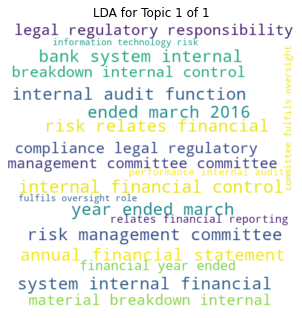

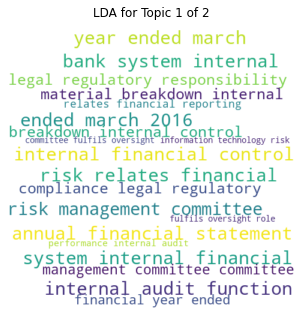

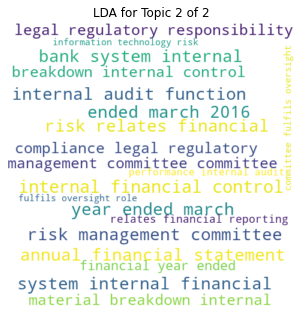

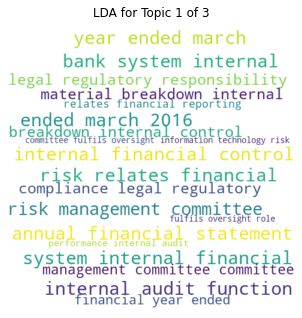

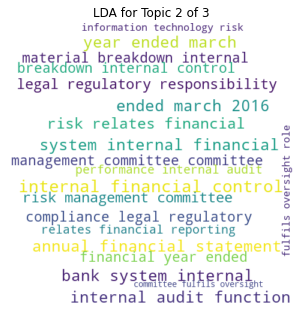

...

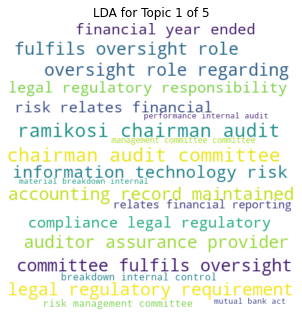

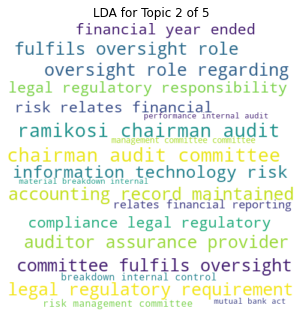

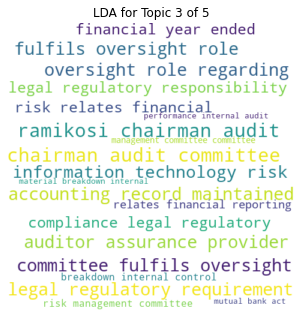

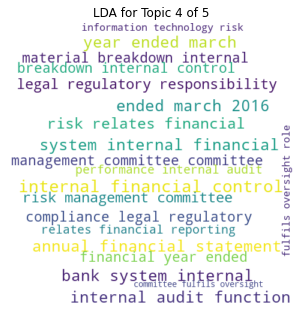

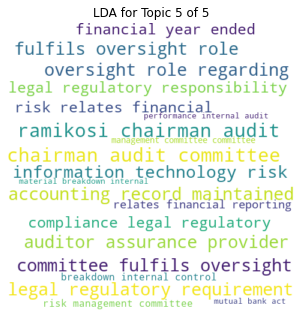

In [ ]:
#Reduce dimensions using LDA for Audit section

#Consider 1-5 topics
for n_topics in range(1,6):
  lda_tfidf3 = fit_LDA(X_tfidf3[4], n_components=n_topics)
  tfidf_feature_names3=vectorizer_tfidf3.get_feature_names()
  wordcloud_topic_freq(lda_tfidf3, tfidf_feature_names3, featureMax)

####6.2.2.2 Term Frequency scaling

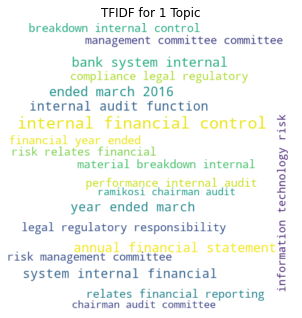

In [ ]:
wordcloud_freq(X_tfidf3[4], vectorizer_tfidf3, featureMax)

####6.2.2.3 Fails: Plots unigrams and does not use frequency

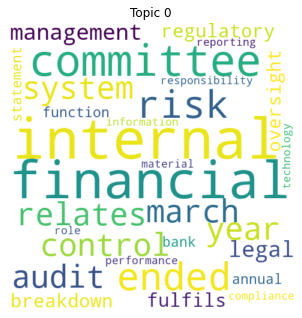

In [ ]:
lda_tfidf3 = fit_LDA(X_tfidf3[4], n_components=1)
tfidf_feature_names3=vectorizer_tfidf3.get_feature_names()
wordcloud_top_words(lda_tfidf3, tfidf_feature_names3, featureMax)

###6.2.4 4-gram

####6.2.2.1 Scale for frequency on multiple topics

In [ ]:
#Vectorise all bigrams
X_tfidf4, vectorizer_tfidf4 = initialise_tfidf_vectorizer(data=headText_df['text'],ngram=4,featureMax=None)

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"


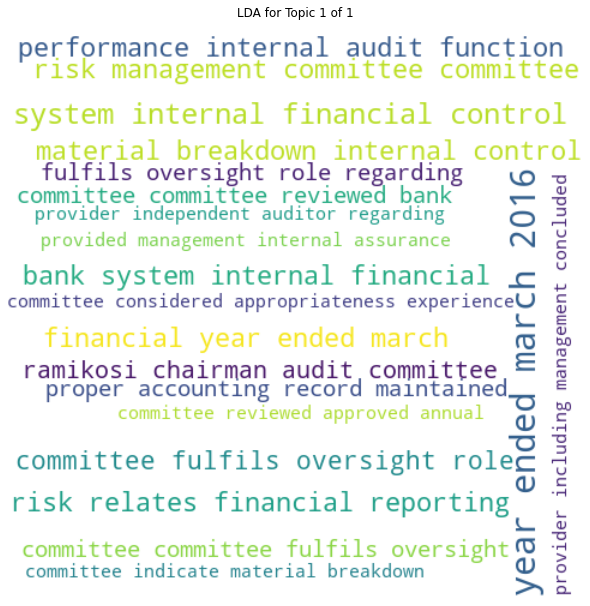

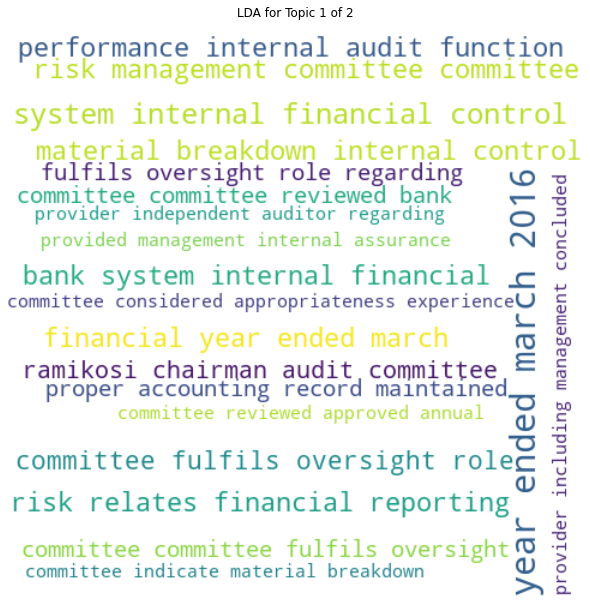

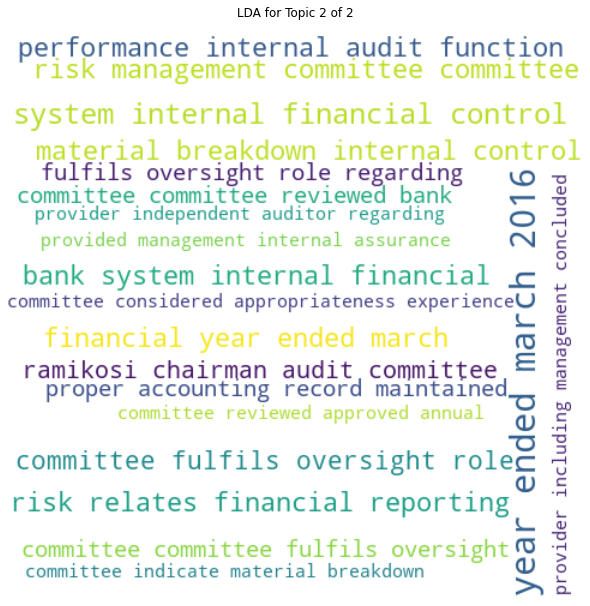

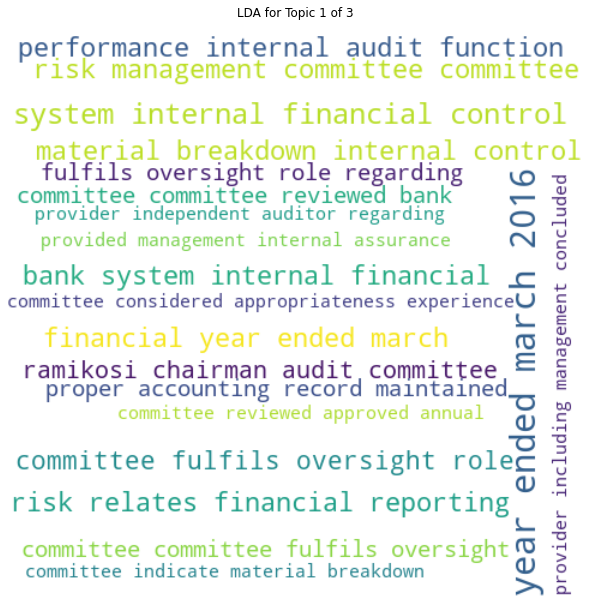

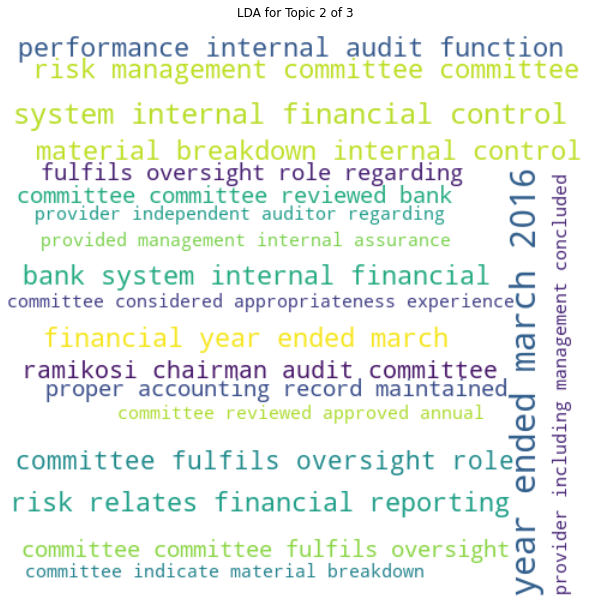

...

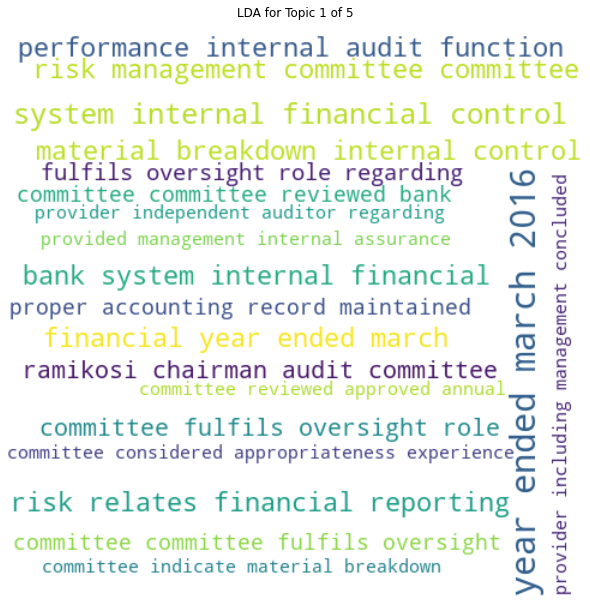

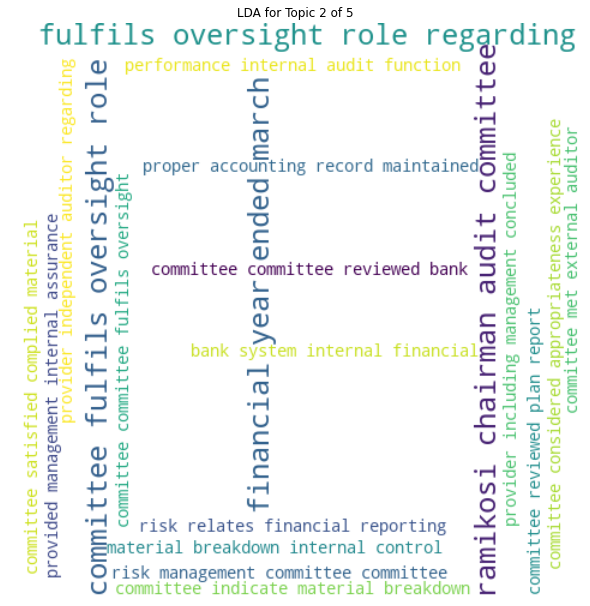

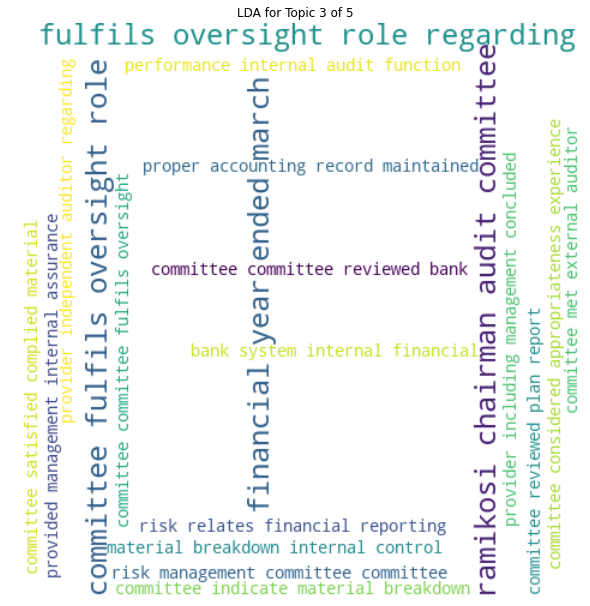

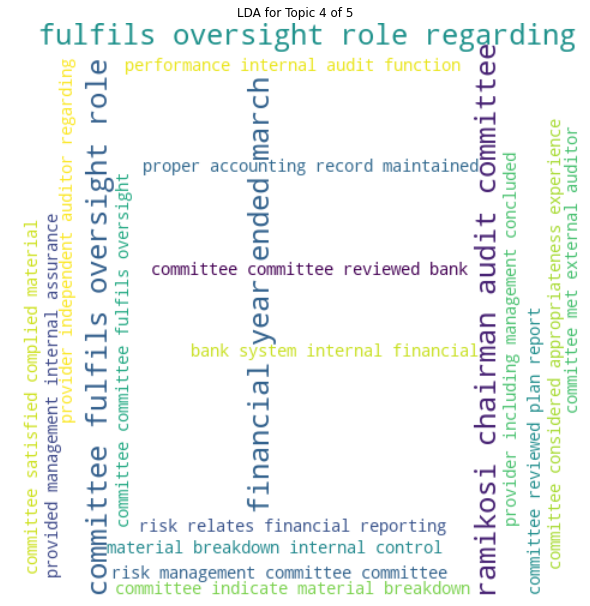

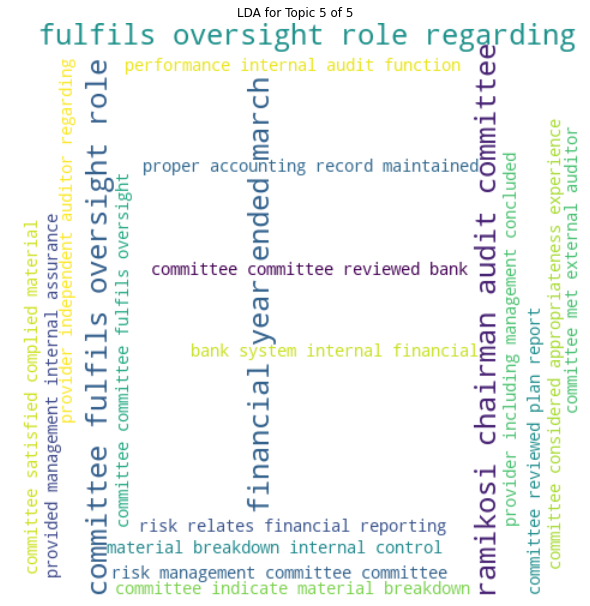

In [ ]:
#Reduce dimensions using LDA for Audit section

#Consider 1-5 topics
for n_topics in range(1,6):
  lda_tfidf4 = fit_LDA(X_tfidf4[4], n_components=n_topics)
  tfidf_feature_names4=vectorizer_tfidf4.get_feature_names()
  wordcloud_topic_freq(lda_tfidf4, tfidf_feature_names4, featureMax)

####6.2.2.2 Term Frequency scaling

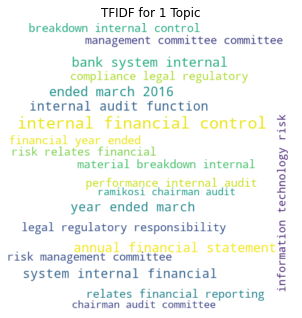

In [ ]:
wordcloud_freq(X_tfidf3[4], vectorizer_tfidf3, featureMax)

####6.2.2.3 Fails: Plots unigrams and does not use frequency

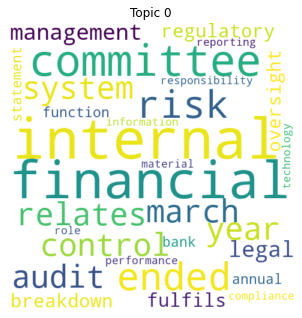

In [ ]:
lda_tfidf4 = fit_LDA(X_tfidf4[4], n_components=1)
wordcloud_top_words(lda_tfidf4, tfidf_feature_names4, featureMax)

###6.2.5 5-gram

####6.2.5.1 Scale for frequency on multiple topics

In [ ]:
#Vectorise all bigrams
X_tfidf5, vectorizer_tfidf5 = initialise_tfidf_vectorizer(data=headText_df['text'],ngram=5,featureMax=None)

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"


In [ ]:
tfidf_feature_names5=vectorizer_tfidf5.get_feature_names()

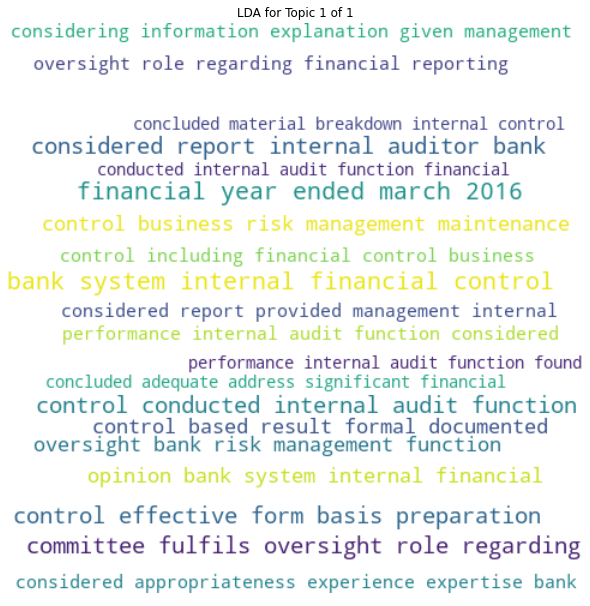

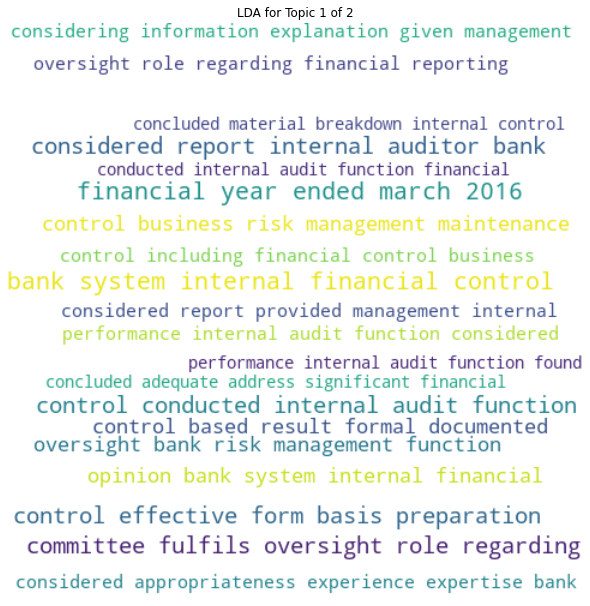

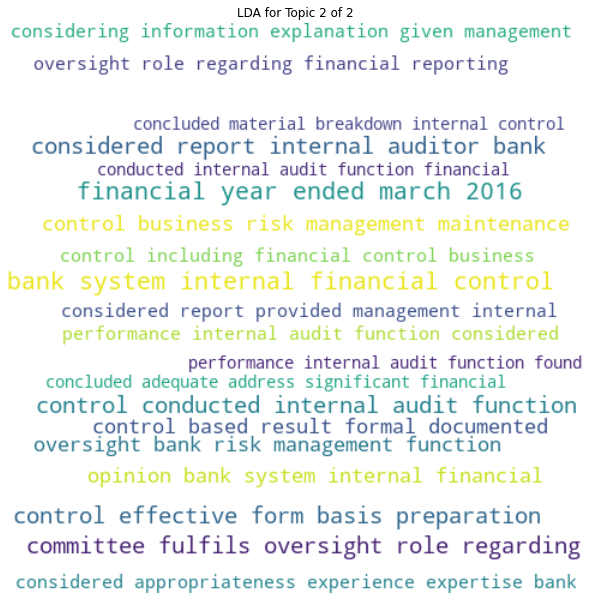

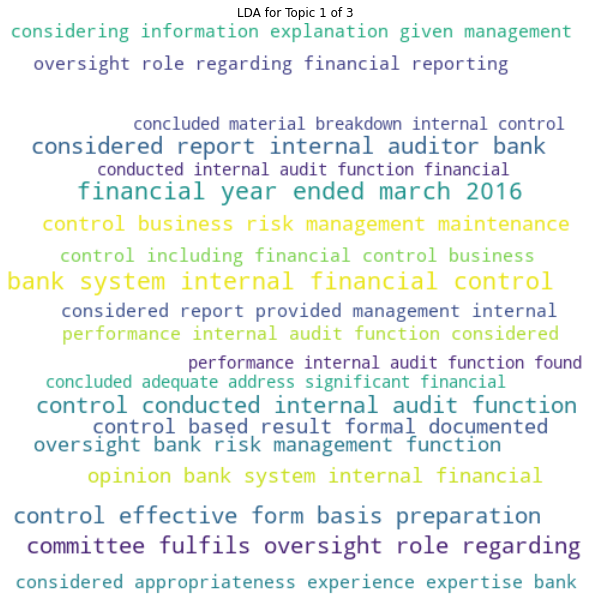

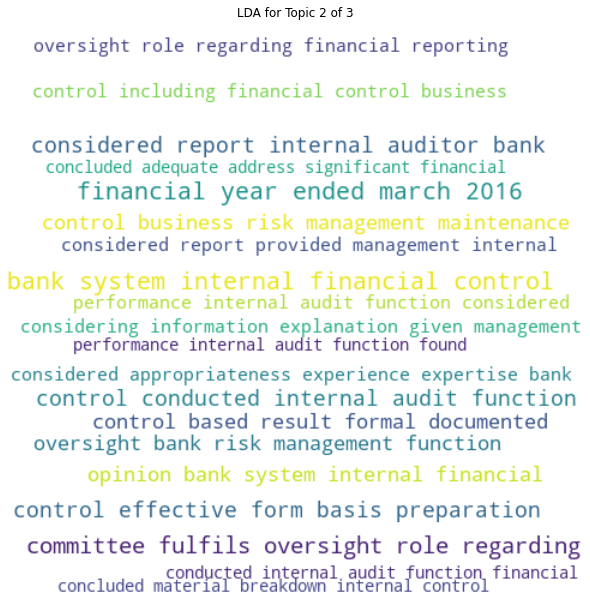

...

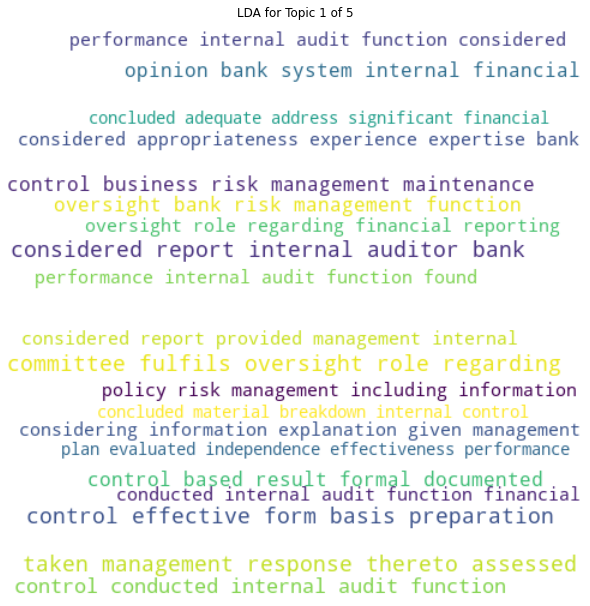

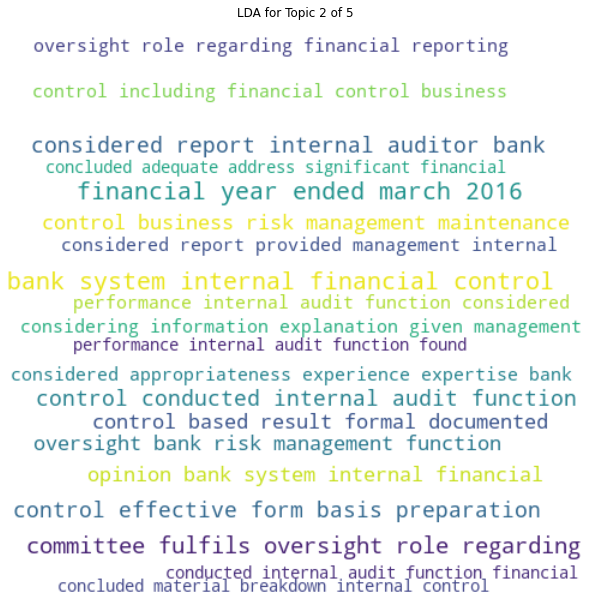

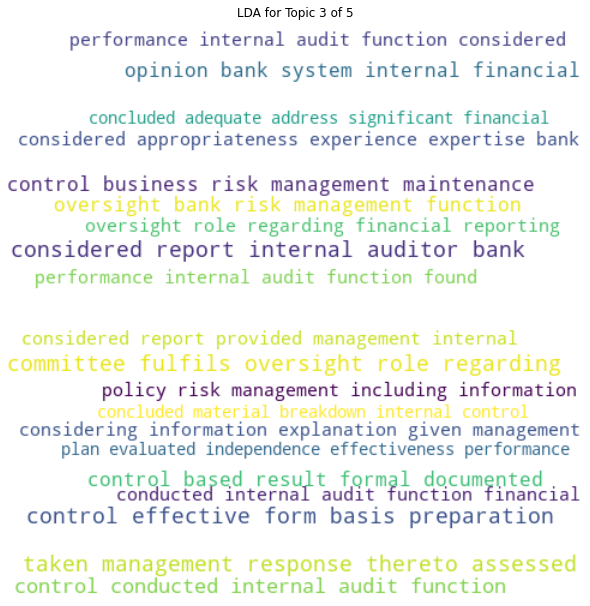

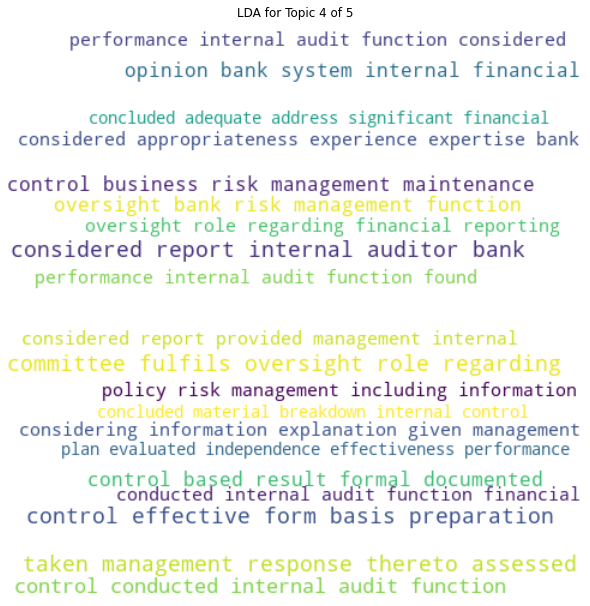

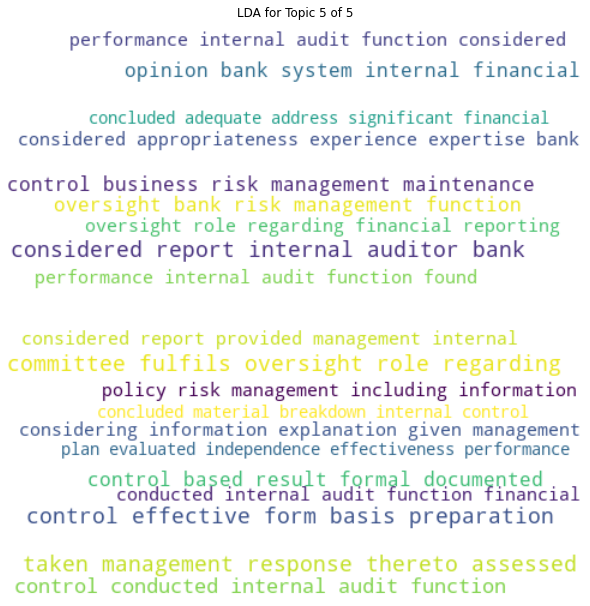

In [ ]:
#Reduce dimensions using LDA for Audit section

#Consider 1-5 topics
for n_topics in range(1,6):
  lda_tfidf5 = fit_LDA(X_tfidf5[4], n_components=n_topics)
  wordcloud_topic_freq(lda_tfidf5, tfidf_feature_names5, featureMax)

####6.2.2.2 Term Frequency scaling

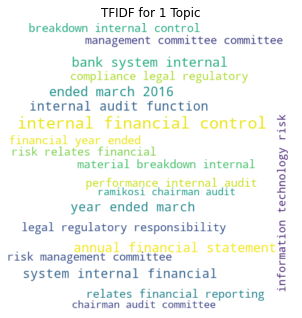

In [ ]:
wordcloud_freq(X_tfidf3[4], vectorizer_tfidf3, featureMax)

####6.2.2.3 Fails: Plots unigrams and does not use frequency

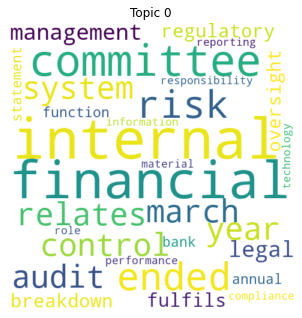

In [ ]:
lda_tfidf4 = fit_LDA(X_tfidf4[4], n_components=1)
wordcloud_top_words(lda_tfidf4, tfidf_feature_names4, featureMax)

#9 Readability analysis

##9.1 Readability using py-readability-metrics

In [ ]:
# Perform readability calculation on text per page
print('Documents to process:',docText_df.shape[0])

for index, docRow in docText_df.iterrows():
    print('Counting words on document',index)

    #Fit text to the Readability function
    r = Readability(docRow.text)

    #Gunning fog 
    try:
      r_gf = r.gunning_fog()                    #calculation
      docText_df.loc[index,'r_gf']=r_gf.score              #score
    except Exception as e:
      print(e)
      
    #Flesch-Kincaid Reading Ease
    try:
      r_f = r.flesch()                          #calculation
      docText_df.loc[index,'r_f']=r_f.score                #score
    except Exception as e:
      print(e)
    
    #Flesch-Kincaid Grade Level
    try:
      r_fk = r.flesch_kincaid()                 #calculation
      docText_df.loc[index,'r_fk']=r_fk.score              #score
    except Exception as e:
      print(e)

    #Dale-Chall
    try:
      r_dc = r.dale_chall()                 #calculation
      docText_df.loc[index,'r_dc']=r_dc.score              #score
    except Exception as e:
      print(e)

    #Automated Readability Index (ARI)
    try:
      r_ari = r.ari()                 #calculation
      docText_df.loc[index,'r_ari']=r_ari.score              #score
    except Exception as e:
      print(e)

    #Coleman-Liau
    try:
      r_cl = r.coleman_liau()                 #calculation
      docText_df.loc[index,'r_cl']=r_cl.score              #score
    except Exception as e:
      print(e)

    #Linsear Write
    try:
      r_lw = r.linsear_write()                 #calculation
      docText_df.loc[index,'r_lw']=r_lw.score              #score
    except Exception as e:
      print(e)

    #SMOG
    try:
      r_sm = r.smog()                 #calculation
      docText_df.loc[index,'r_sm']=r_sm.score              #score
    except Exception as e:
      print(e)

    #SPACHE
    try:
      r_sp = r.spache()                 #calculation
      docText_df.loc[index,'r_sp']=r_sp.score              #score
    except Exception as e:
      print(e)

Documents to process: 265
Counting words on document 0
Counting words on document 1
Counting words on document 2
Counting words on document 3
Counting words on document 4
Counting words on document 5
Counting words on document 6
Counting words on document 7
Counting words on document 8
Counting words on document 9
Counting words on document 10
Counting words on document 11
Counting words on document 12
Counting words on document 13
Counting words on document 14
Counting words on document 15
Counting words on document 16
Counting words on document 17
Counting words on document 18
Counting words on document 19
Counting words on document 20
Counting words on document 21
Counting words on document 22
Counting words on document 23
Counting words on document 24
Counting words on document 25
Counting words on document 26
Counting words on document 27
Counting words on document 28
Counting words on document 29
Counting words on document 30
Counting words on document 31
Counting words on docume

##9.2 Readability using textstat

In [ ]:
# Perform readability calculation on text per document
%%time

#Wall time: 9min 6s

print('Documents to process:',docText_df.shape[0])

for index, pageRow in docText_df.iterrows():
    print('Counting words on document',index)

    text=pageRow.text

    #Gunning fog 
    try:
      docText_df.loc[index,'ts_gf']=ts.gunning_fog(text)
    except Exception as e:
      print(e)
      
    #Flesch-Kincaid Reading Ease
    try:
      docText_df.loc[index,'ts_f']=ts.flesch_reading_ease(text)
    except Exception as e:
      print(e)
    
    #Flesch-Kincaid Grade Level
    try:
      docText_df.loc[index,'ts_fk']=ts.flesch_kincaid_grade(text)
    except Exception as e:
      print(e)

    #Dale-Chall
    try:
      docText_df.loc[index,'ts_dc']=ts.dale_chall_readability_score(text)
    except Exception as e:
      print(e)

    #Automated Readability Index (ARI)
    try:
      docText_df.loc[index,'ts_ari']=ts.automated_readability_index(text)
    except Exception as e:
      print(e)

    #Coleman-Liau
    try:
      docText_df.loc[index,'ts_cl']=ts.coleman_liau_index(text)
    except Exception as e:
      print(e)

    #Linsear Write
    try:
      docText_df.loc[index,'ts_lw']=ts.linsear_write_formula(text)
    except Exception as e:
      print(e)

    #SMOG
    try:
      docText_df.loc[index,'ts_sm']=ts.smog_index(text)
    except Exception as e:
      print(e)

    #Readability Consensus
    try:
      docText_df.loc[index,'ts_ts']=ts.text_standard(text, float_output=True)
    except Exception as e:
      print(e)

Documents to process: 265
Counting words on document 0
Counting words on document 1
Counting words on document 2
Counting words on document 3
Counting words on document 4
Counting words on document 5
Counting words on document 6
Counting words on document 7
Counting words on document 8
Counting words on document 9
Counting words on document 10
Counting words on document 11
Counting words on document 12
Counting words on document 13
Counting words on document 14
Counting words on document 15
Counting words on document 16
Counting words on document 17
Counting words on document 18
Counting words on document 19
Counting words on document 20
Counting words on document 21
Counting words on document 22
Counting words on document 23
Counting words on document 24
Counting words on document 25
Counting words on document 26
Counting words on document 27
Counting words on document 28
Counting words on document 29
Counting words on document 30
Counting words on document 31
Counting words on docume

In [ ]:
docText_df.drop(columns='text').info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 265 entries, 0 to 264
Data columns (total 23 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   coID     265 non-null    int64  
 1   coName   265 non-null    object 
 2   docID    265 non-null    int64  
 3   docName  265 non-null    object 
 4   year     265 non-null    int64  
 5   r_gf     261 non-null    float64
 6   r_f      261 non-null    float64
 7   r_fk     261 non-null    float64
 8   r_dc     261 non-null    float64
 9   r_ari    261 non-null    float64
 10  r_cl     261 non-null    float64
 11  r_lw     261 non-null    float64
 12  r_sm     258 non-null    float64
 13  r_sp     261 non-null    float64
 14  ts_gf    265 non-null    float64
 15  ts_f     265 non-null    float64
 16  ts_fk    265 non-null    float64
 17  ts_dc    265 non-null    float64
 18  ts_ari   265 non-null    float64
 19  ts_cl    265 non-null    float64
 20  ts_lw    265 non-null    float64
 21  ts_sm    265 non

In [ ]:
#Export readability results without the text
docText_df.drop(columns='text').to_csv(pathData+'processed/docReadability.csv')

##9.3 Top 5

###9.3.1 Gunning fog

####9.3.1.1 py-readability-metrics

In [ ]:
#Hard (high values)
docText_df.drop(columns='text').iloc[:,:6].sort_values('r_gf',ascending=False).head()

,coID,coName,docID,docName,year,r_gf
206,30,Bank of Canara,38,Bank of Canara Annual Report 2009 (5324830310).pdf,2009,105074.000000
207,30,Bank of Canara,39,Bank of Canara Annual Report 2010 (5324830310).pdf,2010,100414.000000
208,30,Bank of Canara,40,Bank of Canara Annual Report 2011 (5324830311).pdf,2011,100414.000000
3,2,Absa Group,1,2010- ABSA Group annual-report.pdf,2010,105.779594
191,26,Bank of Baroda,36,Bank of Baroda Annualreport2017-18.pdf,2018,35.200776


In [ ]:
#Easy (low values)
docText_df.drop(columns='text').iloc[:,:6].sort_values('r_gf',ascending=True).head()

,coID,coName,docID,docName,year,r_gf
198,28,Bank of India - Johannesburg Branch,336,State Bank of India_AR_2011_English.pdf,2011,7.968621
156,22,Mercantile Bank Ltd,240,NASDAQ_MBWM_2009.pdf,2009,9.544733
100,17,Societe Generale Johannesburg Branch,282,Societe Generale_Financial Statements 2010.pdf,2010,10.419824
193,27,Bank of China Ltd Jhb Branch,48,BANK OF CHINA LTD JHB BRANCH 2015 Annual Report.pdf,2015,13.953590
152,22,Mercantile Bank Ltd,236,NASDAQ_MBWM_2004.pdf,2004,14.840335


####9.3.1.2 textstat

In [ ]:
#Hard (high values)
pd.merge(docText_df.iloc[:,:5],docText_df.loc[:,'ts_gf'],left_index=True,right_index=True).sort_values('ts_gf').head(9)

,coID,coName,docID,docName,year,ts_gf
122,19,Albaraka Bank Ltd,16,Al Baraka 2008 Full_Annual_Report.pdf,2008,0.00
121,19,Albaraka Bank Ltd,15,Al Baraka 2007 Full_Annual_Report.pdf,2007,0.00
194,27,Bank of China Ltd Jhb Branch,49,BANK OF CHINA LTD JHB BRANCH 2017 Annual Repor...,2017,0.00
195,27,Bank of China Ltd Jhb Branch,50,BANK OF CHINA LTD JHB BRANCH 2018 Annual Repor...,2018,0.00
156,22,Mercantile Bank Ltd,240,NASDAQ_MBWM_2009.pdf,2009,11.54
152,22,Mercantile Bank Ltd,236,NASDAQ_MBWM_2004.pdf,2004,14.98
153,22,Mercantile Bank Ltd,237,NASDAQ_MBWM_2005.pdf,2005,15.49
74,14,Deutsche Bank AG,112,Deutsche_Bank_Annual_Report_2017.pdf,2017,16.19
75,14,Deutsche Bank AG,113,Deutsche_Bank_Annual_Report_2018.pdf,2018,16.22


In [ ]:
#Easy (low values)
pd.merge(docText_df.iloc[:,:5],docText_df.loc[:,'ts_gf'],left_index=True,right_index=True).sort_values('ts_gf',ascending=False).head()

,coID,coName,docID,docName,year,ts_gf
206,30,Bank of Canara,38,Bank of Canara Annual Report 2009 (5324830310)...,2009,37716.40
208,30,Bank of Canara,40,Bank of Canara Annual Report 2011 (5324830311)...,2011,35936.00
207,30,Bank of Canara,39,Bank of Canara Annual Report 2010 (5324830310)...,2010,35936.00
162,22,Mercantile Bank Ltd,246,NASDAQ_MBWM_2015.pdf,2015,157.29
159,22,Mercantile Bank Ltd,243,NASDAQ_MBWM_2012.pdf,2012,141.96


###9.3.2 Flesch-Kincaid Reading Ease

####9.3.2.1 py-readability-metrics

In [ ]:
#Hard (low values)
pd.merge(docText_df.iloc[:,:5],docText_df.loc[:,'r_f'],left_index=True,right_index=True).sort_values('r_f').head()

,coID,coName,docID,docName,year,r_f
206,30,Bank of Canara,38,Bank of Canara Annual Report 2009 (5324830310)...,2009,-266503.040000
208,30,Bank of Canara,40,Bank of Canara Annual Report 2011 (5324830311)...,2011,-254678.290000
207,30,Bank of Canara,39,Bank of Canara Annual Report 2010 (5324830310)...,2010,-254678.290000
3,2,Absa Group,1,2010- ABSA Group annual-report.pdf,2010,-154.391804
167,23,Sasfin Bank Ltd,273,sasfin-integrated-report-2014.pdf,2014,7.772156


In [ ]:
#Easy (high values)
pd.merge(docText_df.iloc[:,:5],docText_df.loc[:,'r_f'],left_index=True,right_index=True).sort_values('r_f',ascending=False).head()

,coID,coName,docID,docName,year,r_f
209,30,Bank of Canara,41,Bank of Canara Annual Report 2012 (5324830314)...,2012,61.429924
188,26,Bank of Baroda,33,Bank of Baroda Annualreport2014-15.pdf,2015,61.050884
198,28,Bank of India - Johannesburg Branch,336,State Bank of India_AR_2011_English.pdf,2011,58.975356
156,22,Mercantile Bank Ltd,240,NASDAQ_MBWM_2009.pdf,2009,56.088259
100,17,Societe Generale Johannesburg Branch,282,Societe Generale_Financial Statements 2010.pdf,2010,55.218164


####9.3.2.2 textstat

In [ ]:
#Hard (low values)
pd.merge(docText_df.iloc[:,:5],docText_df.loc[:,'ts_f'],left_index=True,right_index=True).sort_values('ts_f').head(9)

,coID,coName,docID,docName,year,ts_f
206,30,Bank of Canara,38,Bank of Canara Annual Report 2009 (5324830310)...,2009,-95574.68
207,30,Bank of Canara,39,Bank of Canara Annual Report 2010 (5324830310)...,2010,-91056.91
208,30,Bank of Canara,40,Bank of Canara Annual Report 2011 (5324830311)...,2011,-91056.91
162,22,Mercantile Bank Ltd,246,NASDAQ_MBWM_2015.pdf,2015,-376.16
159,22,Mercantile Bank Ltd,243,NASDAQ_MBWM_2012.pdf,2012,-328.83
161,22,Mercantile Bank Ltd,245,NASDAQ_MBWM_2014.pdf,2014,-308.53
157,22,Mercantile Bank Ltd,241,NASDAQ_MBWM_2010.pdf,2010,-213.62
160,22,Mercantile Bank Ltd,244,NASDAQ_MBWM_2013.pdf,2013,-207.50
158,22,Mercantile Bank Ltd,242,NASDAQ_MBWM_2011.pdf,2011,-202.32


In [ ]:
#Easy (high values)
pd.merge(docText_df.iloc[:,:5],docText_df.loc[:,'ts_f'],left_index=True,right_index=True).sort_values('ts_f',ascending=False).head()

,coID,coName,docID,docName,year,ts_f
195,27,Bank of China Ltd Jhb Branch,50,BANK OF CHINA LTD JHB BRANCH 2018 Annual Repor...,2018,206.84
121,19,Albaraka Bank Ltd,15,Al Baraka 2007 Full_Annual_Report.pdf,2007,206.84
122,19,Albaraka Bank Ltd,16,Al Baraka 2008 Full_Annual_Report.pdf,2008,206.84
194,27,Bank of China Ltd Jhb Branch,49,BANK OF CHINA LTD JHB BRANCH 2017 Annual Repor...,2017,206.84
153,22,Mercantile Bank Ltd,237,NASDAQ_MBWM_2005.pdf,2005,40.72


###9.3.3 Text Standard

####9.3.3.1 textstat

In [ ]:
#Hard
pd.merge(docText_df.iloc[:,:5],docText_df.loc[:,'ts_ts'],left_index=True,right_index=True).sort_values('ts_ts',ascending=False).head()

,coID,coName,docID,docName,year,ts_ts
206,30,Bank of Canara,38,Bank of Canara Annual Report 2009 (5324830310).pdf,2009,36769.0
208,30,Bank of Canara,40,Bank of Canara Annual Report 2011 (5324830311).pdf,2011,35033.0
207,30,Bank of Canara,39,Bank of Canara Annual Report 2010 (5324830310).pdf,2010,35033.0
162,22,Mercantile Bank Ltd,246,NASDAQ_MBWM_2015.pdf,2015,163.0
165,22,Mercantile Bank Ltd,249,NASDAQ_MBWM_2018.pdf,2018,73.0


In [ ]:
#Easy
pd.merge(docText_df.iloc[:,:5],docText_df.loc[:,'ts_ts'],left_index=True,right_index=True).sort_values('ts_ts',ascending=True).head(9)

,coID,coName,docID,docName,year,ts_ts
194,27,Bank of China Ltd Jhb Branch,49,BANK OF CHINA LTD JHB BRANCH 2017 Annual Report.pdf,2017,0.0
195,27,Bank of China Ltd Jhb Branch,50,BANK OF CHINA LTD JHB BRANCH 2018 Annual Report.pdf,2018,0.0
121,19,Albaraka Bank Ltd,15,Al Baraka 2007 Full_Annual_Report.pdf,2007,0.0
122,19,Albaraka Bank Ltd,16,Al Baraka 2008 Full_Annual_Report.pdf,2008,0.0
232,32,ICICI Bank Ltd,188,Subsidiaries_of_ICICI_Bank_Annual_Report_FY2019 2018.pdf,2019,4.0
171,23,Sasfin Bank Ltd,277,SASFIN_ar_jun16.pdf,2016,8.0
156,22,Mercantile Bank Ltd,240,NASDAQ_MBWM_2009.pdf,2009,12.0
0,1,VBS Mutual Bank,357,VBS-2015-Annual-Report.pdf,2015,13.0
22,7,Investec Bank Ltd,198,Limited-Annual-Report-FA 2012.pdf,2012,13.0


#10 Principal Component Analysis (PCA)

In [ ]:
documents_tokenized=reg_tokenize(docText_df['text'])

In [ ]:
len(documents_tokenized)

265

In [ ]:
#CBOW
w2v_model = Word2Vec(documents_tokenized, size=embedding_size, window=window_size, min_count=min_count_words, workers=threads, sg=0)

In [ ]:
len(w2v_model.wv.vocab)

32761

In [ ]:
# Get first 1000 words per class
# Replace with most significant unigrams

labels_viz = []
tokens_viz = []
risk_viz=[]

for risk in range(0,2):
    docCount = 0
    wordCount=0
    while wordCount<1000 and docCount < len(documents_tokenized):
        if docText_df.loc[docCount,'risk']==risk:
            for word in documents_tokenized[docCount]:
                if wordCount<1000 and word in word in w2v_model.wv.vocab:
                    tokens_viz.append(w2v_model[word])
                    labels_viz.append(word)
                    risk_viz.append(risk)
                    wordCount+=1
            #print('docCount:',docCount,'|wordCount:',wordCount)
        docCount+=1      

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:15: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  from ipykernel import kernelapp as app


In [ ]:
#Number of tokens
len(tokens_viz)

2000

In [ ]:
#Each token has 300 dimensions of the word vector
tokens_viz[0:5]

[array([-2.28986397e-01,  3.75386000e-01, -7.99197674e-01, -7.40172625e-01,
         3.77890825e-01, -1.67112246e-01, -9.06046256e-02,  9.02595699e-01,
         5.70197940e-01,  2.43183091e-01, -3.75688821e-02, -1.48489094e+00,
        -5.37929356e-01, -6.79585934e-01,  2.18053684e-01, -6.11599505e-01,
         4.53415811e-02,  4.25415933e-01,  4.91019994e-01,  5.38038254e-01,
         4.49608773e-01, -4.24596667e-01, -4.66070414e-01, -1.05061042e+00,
        -2.68722773e-02, -5.94329871e-02,  9.89142478e-01, -3.22768003e-01,
         1.12211779e-01, -3.32031667e-01,  1.74530029e-01,  4.65325415e-01,
         2.06400201e-01,  9.82714966e-02,  5.52851856e-01,  6.69831276e-01,
         6.95506334e-01,  1.91946253e-02,  8.56465399e-01, -8.17014515e-01,
        -1.08467138e+00,  8.45663436e-03, -1.92505881e-01,  1.21148300e+00,
        -4.42757942e-02,  4.14475799e-01,  8.06959629e-01,  6.41804993e-01,
         8.77169549e-01, -6.62381768e-01, -4.02626514e-01, -1.62733331e-01,
         2.6

In [ ]:
#Build the PCA model

pca = PCA(n_components=4)

In [ ]:
#Fit the PCA model

pca_model = pca.fit_transform(tokens_viz)

In [ ]:
pca_df = pd.DataFrame(pca_model, columns = ['pca1','pca2','pca3','pca4'])

In [ ]:
print('Variance explained per principal component: {}'.format(pca.explained_variance_ratio_))

Variance explained per principal component: [0.09497818 0.06973358 0.05831448 0.05204841]


In [ ]:
pca_df.shape[00]

2000

CPU times: user 10.3 s, sys: 163 ms, total: 10.4 s
Wall time: 10.4 s


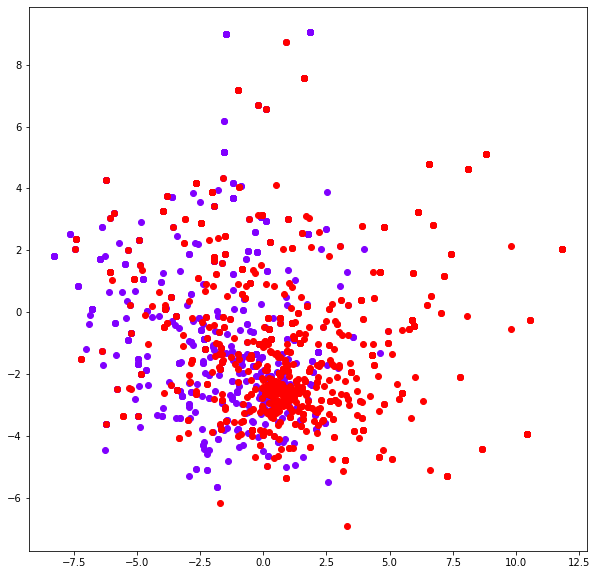

In [ ]:
%%time
x = []
y = []
for value in pca_df[['pca1','pca2']].values:
    x.append(value[0])
    y.append(value[1])
    
plt.figure(figsize=(10, 10))
colour=cm.rainbow(np.linspace(0,1,2))

for i in range(pca_df.shape[0]):
    plt.scatter(x[i],y[i],c=colour[risk_viz[i]].reshape(1,-1), label='Risk'+str(risk_viz[i]))

#12 t-distributed Stochastic Neighbour Embedding (t-SNE)

##12.1 Reduce dimensionality first

Scikit-learn documentation:

It is highly recommended to use another dimensionality reduction method (e.g., PCA for dense data or TruncatedSVD for sparse data) to reduce the number of dimensions to a reasonable amount (e.g., 50) if the number of features is very high. This will suppress some noise and speed up the computation of pairwise distances between samples.

In [ ]:
#Build the tSNE model
#perplexity (default: 30): The perplexity is related to the number of nearest neighbors that are used in other manifold learning algorithms. Consider selecting a value between 5 and 50.
#n_components (default: 2): Dimension of the embedded space.
#n_iter (default: 1000): Maximum number of iterations for the optimization. Should be at least 250.
#early_exaggeration (default: 12.0): Controls how tight natural clusters in the original space are in the embedded space and how much space will be between them.
#learning_rate (default: 200.0): The learning rate for t-SNE is usually in the range (10.0, 1000.0).
#method (default: ‘barnes_hut’): Barnes-Hut approximation runs in O(NlogN) time. method=’exact’ will run on the slower, but exact, algorithm in O(N^2) time.
#random_state: For repeatability

tsne_model = TSNE(perplexity=40, n_components=2, init='pca', n_iter=1500)

In [ ]:
#Train the tSNE model
#Note: This will take some time

#4min 35s
%%time

w2v_tsne = tsne_model.fit_transform(tokens_viz)

CPU times: user 47.6 s, sys: 222 ms, total: 47.8 s
Wall time: 25.9 s


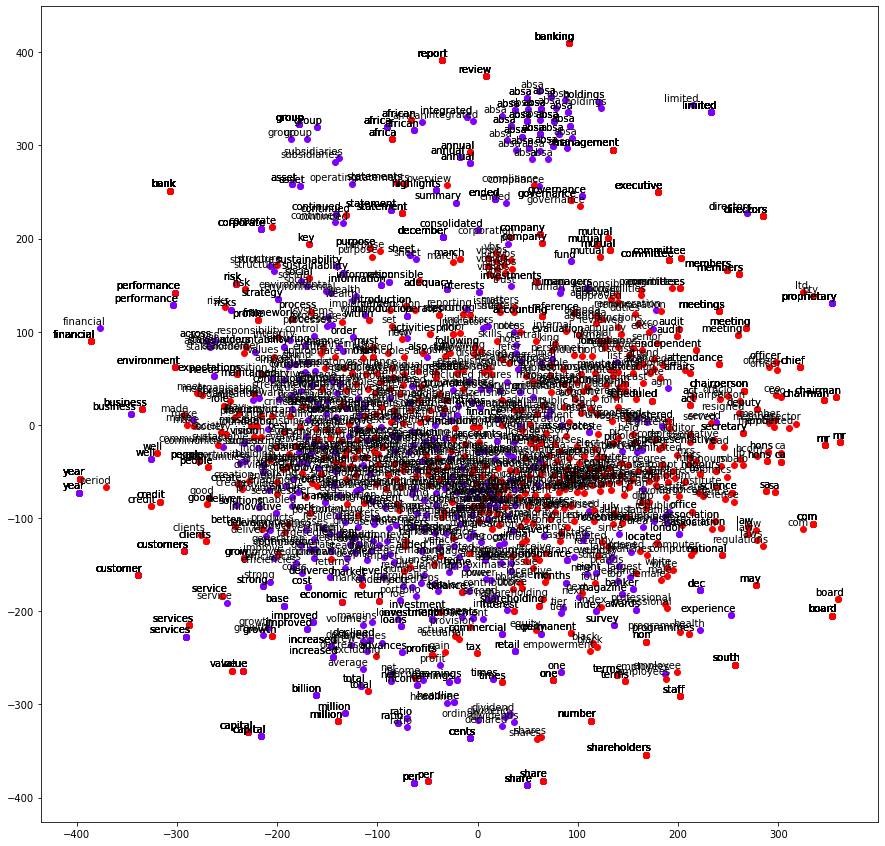

In [ ]:
x = []
y = []
for value in w2v_tsne:
    x.append(value[0])
    y.append(value[1])
    
plt.figure(figsize=(15, 15))
colour=cm.rainbow(np.linspace(0,1,2))

for i in range(len(w2v_tsne)):
    plt.scatter(x[i],y[i],c=colour[risk_viz[i]].reshape(1,-1))
    #plt.scatter(x[i],y[i])
    plt.annotate(labels_viz[i],
                    xy=(x[i], y[i]),
                    xytext=(5, 2),
                    textcoords='offset points',
                    ha='right',
                    va='bottom')

CPU times: user 10.5 s, sys: 8.94 ms, total: 10.6 s
Wall time: 10.6 s


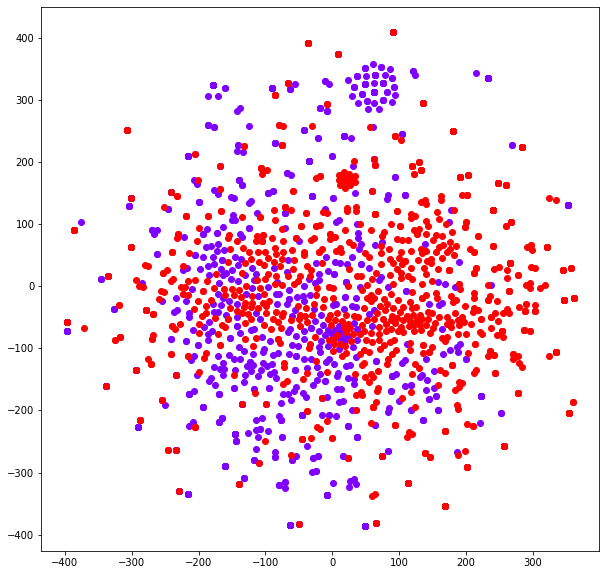

In [ ]:
%%time
x = []
y = []
for value in w2v_tsne:
    x.append(value[0])
    y.append(value[1])
    
plt.figure(figsize=(10, 10))
colour=cm.rainbow(np.linspace(0,1,2))

for i in range(len(w2v_tsne)):
    plt.scatter(x[i],y[i],c=colour[risk_viz[i]].reshape(1,-1), label='Risk'+str(risk_viz[i]))

#13 Feature selection

*   CFS
*   Ensemble: ExtraTreesClassifier
*   Recursive Feature Elimination (RFE)
*   Chi-Squared (categorical features)



##13.9 Chi-Squared

In [ ]:
significance=0.05

In [ ]:
chi_scores = chi2(v_train,y_train)

In [ ]:
p_values = pd.Series(chi_scores[1],index = v_train.columns)

In [ ]:
p_values.sort_values(ascending = True , inplace = True)

###13.9.1 x+c+r

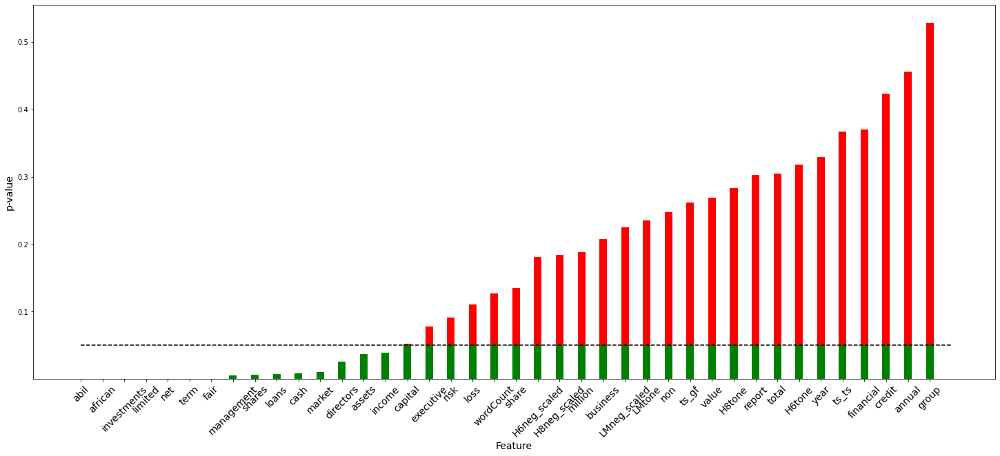

In [ ]:
fig, ax = plt.subplots()
fig.set_size_inches(25,10)
y=p_values[0:40]
plt.ylabel('p-value')
ax.yaxis.label.set_size(14)

x=pd.DataFrame(y).index
plt.xticks(rotation=45)
plt.xticks(fontsize=14)
plt.xlabel('Feature')
ax.xaxis.label.set_size(14)

#split bars
above_significance = np.maximum(y - significance, 0)
below_significance = np.minimum(y, significance)

ax.bar(x, below_significance, 0.35, color="g")
ax.bar(x, above_significance, 0.35, color="r",bottom=below_significance)

#ax.bar(x,p_values)
# horizontal line indicating the threshold
ax.plot([0., len(y)], [significance, significance], "k--")

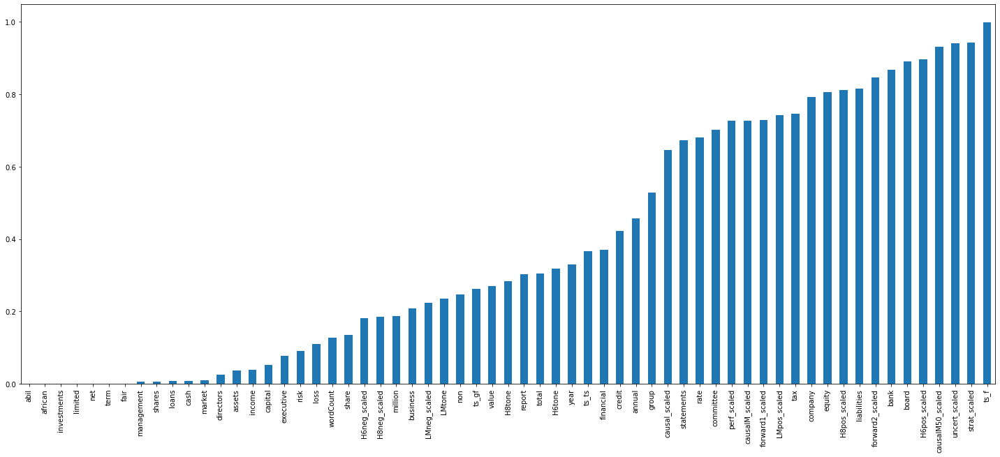

In [ ]:
p_values.plot(kind='bar',figsize=(25,10))

In [ ]:
#Variables with low p-values are relatively dependent
#if p is less than the significance value (0.05) reject the Null Hypothesis (independence)
p_values[p_values<0.1]

abil           1.387914e-28
african        3.605700e-17
investments    7.013286e-09
limited        1.162936e-05
net            3.098006e-05
term           1.447678e-04
fair           3.495606e-04
management     5.115791e-03
shares         6.151813e-03
loans          7.402294e-03
cash           8.185602e-03
market         1.011373e-02
directors      2.556387e-02
assets         3.654747e-02
income         3.870825e-02
capital        5.186317e-02
executive      7.804538e-02
risk           9.110755e-02
dtype: float64

In [ ]:
p_values.sort_values(ascending = False , inplace = True)

In [ ]:
#Variables with high p-values are relatively independent
p_values[p_values>0.05]

ts_f                0.997850
strat_scaled        0.942222
uncert_scaled       0.940126
causalM50_scaled    0.931416
H6pos_scaled        0.896778
board               0.890671
bank                0.867875
forward2_scaled     0.846525
liabilities         0.815627
H8pos_scaled        0.810648
equity              0.804857
company             0.792699
tax                 0.746199
LMpos_scaled        0.743063
forward1_scaled     0.728838
causalM_scaled      0.726489
perf_scaled         0.726095
committee           0.700813
rate                0.680766
statements          0.673545
causal_scaled       0.645743
group               0.528821
annual              0.455981
credit              0.422857
financial           0.370513
ts_ts               0.366495
year                0.328755
H6tone              0.318121
total               0.304478
report              0.302606
H8tone              0.282883
value               0.269138
ts_gf               0.262181
non                 0.247742
LMtone        

In [ ]:
#Variables with low p-values are relatively dependent
#if p is less than the significance value (0.05) reject the Null Hypothesis (independence)
p_values[0:60]

ts_f                9.978498e-01
strat_scaled        9.422225e-01
uncert_scaled       9.401259e-01
causalM50_scaled    9.314161e-01
H6pos_scaled        8.967775e-01
board               8.906706e-01
bank                8.678749e-01
forward2_scaled     8.465253e-01
liabilities         8.156275e-01
H8pos_scaled        8.106484e-01
equity              8.048566e-01
company             7.926989e-01
tax                 7.461992e-01
LMpos_scaled        7.430633e-01
forward1_scaled     7.288376e-01
causalM_scaled      7.264888e-01
perf_scaled         7.260952e-01
committee           7.008127e-01
rate                6.807659e-01
statements          6.735453e-01
causal_scaled       6.457434e-01
group               5.288212e-01
annual              4.559806e-01
credit              4.228570e-01
financial           3.705129e-01
ts_ts               3.664955e-01
year                3.287552e-01
H6tone              3.181211e-01
total               3.044776e-01
report              3.026058e-01
H8tone    

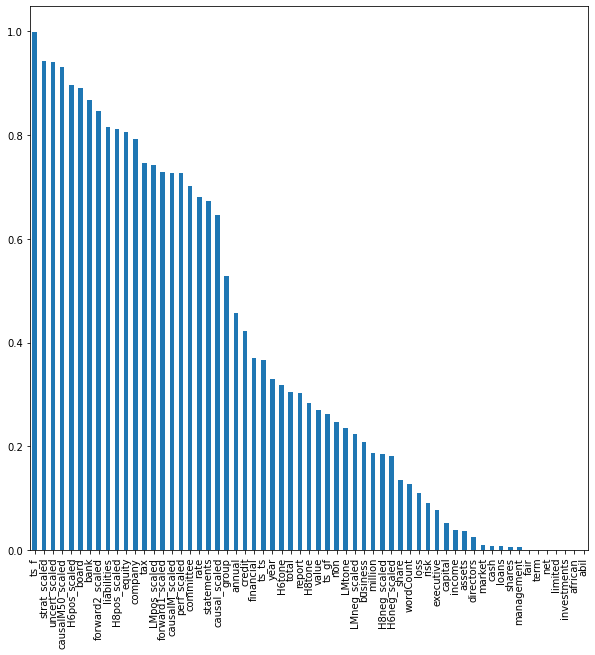

In [ ]:
p_values.plot(kind='bar',figsize=(10,10))

###13.9.2 x+cc+rr

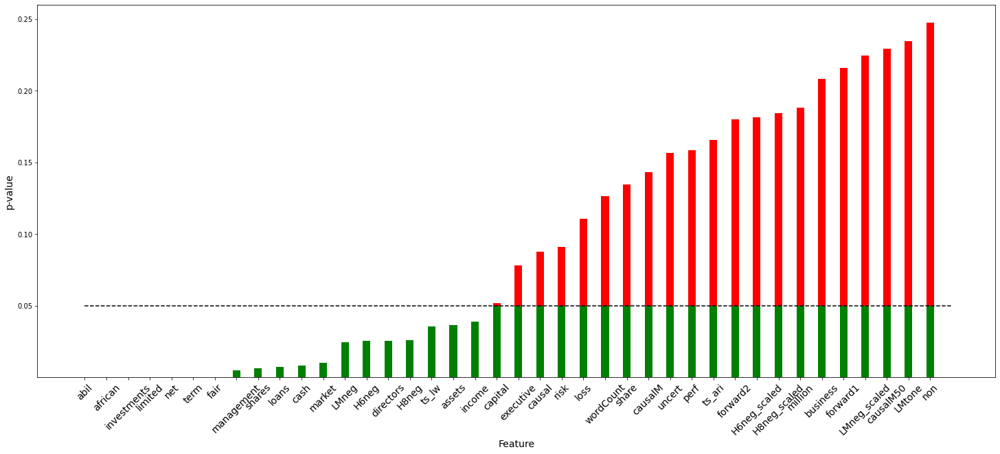

In [ ]:
fig, ax = plt.subplots()
fig.set_size_inches(25,10)

y=p_values[0:40]
plt.ylabel('p-value')
ax.yaxis.label.set_size(14)

x=pd.DataFrame(y).index
plt.xticks(rotation=45)
plt.xticks(fontsize=14)
plt.xlabel('Feature')
ax.xaxis.label.set_size(14)

#split bars
above_significance = np.maximum(y - significance, 0)
below_significance = np.minimum(y, significance)

ax.bar(x, below_significance, 0.35, color="g")
ax.bar(x, above_significance, 0.35, color="r",bottom=below_significance)

#ax.bar(x,p_values)
# horizontal line indicating the threshold
ax.plot([0., len(y)], [significance, significance], "k--")

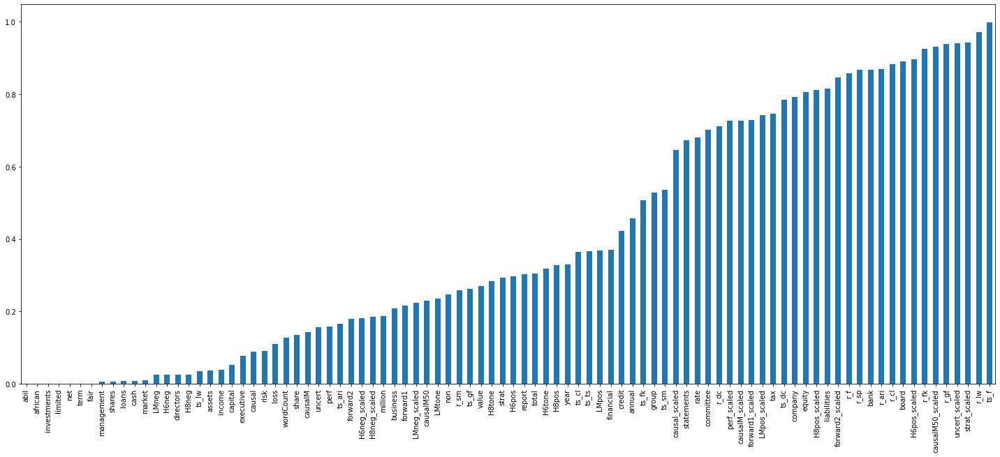

In [ ]:
p_values.plot(kind='bar',figsize=(25,10))

In [ ]:
#Variables with low p-values are relatively dependent
#if p is less than the significance value (0.05) reject the Null Hypothesis (independence)
p_values[p_values<0.1]

abil           1.387914e-28
african        3.605700e-17
investments    7.013286e-09
limited        1.162936e-05
net            3.098006e-05
term           1.447678e-04
fair           3.495606e-04
management     5.115791e-03
shares         6.151813e-03
loans          7.402294e-03
cash           8.185602e-03
market         1.011373e-02
LMneg          2.437834e-02
H6neg          2.530642e-02
directors      2.556387e-02
H8neg          2.583048e-02
ts_lw          3.540235e-02
assets         3.654747e-02
income         3.870825e-02
capital        5.186317e-02
executive      7.804538e-02
causal         8.782954e-02
risk           9.110755e-02
dtype: float64

In [ ]:
p_values.sort_values(ascending = False , inplace = True)

In [ ]:
#Variables with high p-values are relatively independent
p_values[p_values>0.05]

ts_f             0.997850
r_lw             0.971378
strat_scaled     0.942222
uncert_scaled    0.940126
r_gf             0.938390
                   ...   
loss             0.110853
risk             0.091108
causal           0.087830
executive        0.078045
capital          0.051863
Length: 71, dtype: float64

In [ ]:
#Variables with low p-values are relatively dependent
#if p is less than the significance value (0.05) reject the Null Hypothesis (independence)
p_values[0:60]

ts_f                0.997850
r_lw                0.971378
strat_scaled        0.942222
uncert_scaled       0.940126
r_gf                0.938390
causalM50_scaled    0.931416
r_fk                0.926118
H6pos_scaled        0.896778
board               0.890671
r_cl                0.883716
r_ari               0.869306
bank                0.867875
r_sp                0.866606
r_f                 0.857234
forward2_scaled     0.846525
liabilities         0.815627
H8pos_scaled        0.810648
equity              0.804857
company             0.792699
ts_dc               0.784471
tax                 0.746199
LMpos_scaled        0.743063
forward1_scaled     0.728838
causalM_scaled      0.726489
perf_scaled         0.726095
r_dc                0.710472
committee           0.700813
rate                0.680766
statements          0.673545
causal_scaled       0.645743
ts_sm               0.536267
group               0.528821
ts_fk               0.506346
annual              0.455981
credit        

###13.9.3 Diagnose

In [ ]:
#first array represents chi square values and second array represents p-values
chi_scores

(array([1.23009377e+02, 7.09816110e+01, 5.55742980e-01, 4.37137596e+00,
        2.76751403e-02, 1.88940653e-02, 1.58462288e+00, 3.78017715e+00,
        6.99241099e+00, 1.47627796e-01, 6.90677872e-02, 6.42361377e-01,
        4.98527850e+00, 6.10419599e-02, 3.10514287e+00, 1.27841924e+01,
        8.01943561e-01, 3.96656178e-01, 4.27362567e+00, 3.35311196e+01,
        5.43694118e-02, 1.92231653e+01, 7.17265993e+00, 2.54201914e+00,
        7.83804467e+00, 6.61475464e+00, 1.73351195e+00, 1.73567218e+01,
        1.33598968e+00, 1.69264957e-01, 1.06267525e+00, 2.85469449e+00,
        2.23727625e+00, 7.50528713e+00, 1.77483018e-01, 1.04752637e-01,
        1.44390663e+01, 1.05447992e+00, 1.22113525e+00, 9.53795151e-01,
        2.33378889e+00, 1.20181586e-01, 3.74630376e-02, 1.47516222e+00,
        1.07452497e-01, 1.78705755e+00, 1.68306935e-02, 1.76353350e+00,
        5.74031698e-02, 5.64175507e-03, 2.11308956e-01, 1.22360007e-01,
        7.40689453e-03, 1.22727230e-01, 5.25288900e-03, 1.411990

In [ ]:
v_train.columns

Index(['abil', 'african', 'annual', 'assets', 'bank', 'board', 'business',
       'capital', 'cash', 'committee', 'company', 'credit', 'directors',
       'equity', 'executive', 'fair', 'financial', 'group', 'income',
       'investments', 'liabilities', 'limited', 'loans', 'loss', 'management',
       'market', 'million', 'net', 'non', 'rate', 'report', 'risk', 'share',
       'shares', 'statements', 'tax', 'term', 'total', 'value', 'year',
       'wordCount', 'forward1_scaled', 'forward2_scaled', 'LMneg_scaled',
       'LMpos_scaled', 'H6neg_scaled', 'H6pos_scaled', 'H8neg_scaled',
       'H8pos_scaled', 'uncert_scaled', 'causal_scaled', 'causalM_scaled',
       'causalM50_scaled', 'perf_scaled', 'strat_scaled', 'LMtone', 'H6tone',
       'H8tone'],
      dtype='object')